<a href="https://colab.research.google.com/github/Iksan03/DeepLearning/blob/main/Week12-Python-WGAN-GP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

def make_grad_hook():
    '''
    Function to keep track of gradients for visualization purposes, 
    which fills the grads list when using model.apply(grad_hook).
    '''
    grads = []
    def grad_hook(m):
        if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
            grads.append(m.weight.grad)
    return grads, grad_hook

In [2]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels of the output image, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
      n_samples: the number of samples to generate, a scalar
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

In [3]:
class Critic(nn.Module):
    '''
    Critic Class
    Values:
        im_chan: the number of channels of the output image, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Critic, self).__init__()
        self.crit = nn.Sequential(
            self.make_crit_block(im_chan, hidden_dim),
            self.make_crit_block(hidden_dim, hidden_dim * 2),
            self.make_crit_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a critic block of DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the critic: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)

In [6]:
n_epochs = 100
z_dim = 64
display_step = 50
batch_size = 128
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
crit_repeats = 5
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=True, transform=transform),
    batch_size=batch_size,
    shuffle=True)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [7]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)


In [8]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gradient
def get_gradient(crit, real, fake, epsilon):
    '''
    Return the gradient of the critic's scores with respect to mixes of real and fake images.
    Parameters:
        crit: the critic model
        real: a batch of real images
        fake: a batch of fake images
        epsilon: a vector of the uniformly random proportions of real/fake per mixed image
    Returns:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    '''
    # Mix the images together
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Calculate the critic's scores on the mixed images
    mixed_scores = crit(mixed_images)
    
    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        # Note: You need to take the gradient of outputs with respect to inputs.
        # This documentation may be useful, but it should not be necessary:
        # https://pytorch.org/docs/stable/autograd.html#torch.autograd.grad
        #### START CODE HERE ####
        inputs=mixed_images,
        outputs=mixed_scores,
        #### END CODE HERE ####
        # These other parameters have to do with the pytorch autograd engine works
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient


In [9]:
# UNIT TEST
# DO NOT MODIFY THIS
def test_get_gradient(image_shape):
    real = torch.randn(*image_shape, device=device) + 1
    fake = torch.randn(*image_shape, device=device) - 1
    epsilon_shape = [1 for _ in image_shape]
    epsilon_shape[0] = image_shape[0]
    epsilon = torch.rand(epsilon_shape, device=device).requires_grad_()
    gradient = get_gradient(crit, real, fake, epsilon)
    assert tuple(gradient.shape) == image_shape
    assert gradient.max() > 0
    assert gradient.min() < 0
    return gradient

gradient = test_get_gradient((256, 1, 28, 28))
print("Success!")

Success!


In [10]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: gradient_penalty
def gradient_penalty(gradient):
    '''
    Return the gradient penalty, given a gradient.
    Given a batch of image gradients, you calculate the magnitude of each image's gradient
    and penalize the mean quadratic distance of each magnitude to 1.
    Parameters:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    Returns:
        penalty: the gradient penalty
    '''
    # Flatten the gradients so that each row captures one image
    gradient = gradient.view(len(gradient), -1)

    # Calculate the magnitude of every row
    gradient_norm = gradient.norm(2, dim=1)
    
    # Penalize the mean squared distance of the gradient norms from 1
    #### START CODE HERE ####
    penalty = torch.mean((gradient_norm - 1)**2)
    #### END CODE HERE ####
    return penalty

In [11]:
# UNIT TEST
def test_gradient_penalty(image_shape):
    bad_gradient = torch.zeros(*image_shape)
    bad_gradient_penalty = gradient_penalty(bad_gradient)
    assert torch.isclose(bad_gradient_penalty, torch.tensor(1.))

    image_size = torch.prod(torch.Tensor(image_shape[1:]))
    good_gradient = torch.ones(*image_shape) / torch.sqrt(image_size)
    good_gradient_penalty = gradient_penalty(good_gradient)
    assert torch.isclose(good_gradient_penalty, torch.tensor(0.))

    random_gradient = test_get_gradient(image_shape)
    random_gradient_penalty = gradient_penalty(random_gradient)
    assert torch.abs(random_gradient_penalty - 1) < 0.1

test_gradient_penalty((256, 1, 28, 28))
print("Success!")

Success!


In [12]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(crit_fake_pred):
    '''
    Return the loss of a generator given the critic's scores of the generator's fake images.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
    Returns:
        gen_loss: a scalar loss value for the current batch of the generator
    '''
    #### START CODE HERE ####
    gen_loss = -1. * torch.mean(crit_fake_pred)
    #### END CODE HERE ####
    return gen_loss

In [13]:
# UNIT TEST
assert torch.isclose(
    get_gen_loss(torch.tensor(1.)),
    torch.tensor(-1.0)
)
print("Success!")

Success!


In [14]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_crit_loss
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    '''
    Return the loss of a critic given the critic's scores for fake and real images,
    the gradient penalty, and gradient penalty weight.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
        crit_real_pred: the critic's scores of the real images
        gp: the unweighted gradient penalty
        c_lambda: the current weight of the gradient penalty 
    Returns:
        crit_loss: a scalar for the critic's loss, accounting for the relevant factors
    '''
    #### START CODE HERE ####
    crit_loss = torch.mean(crit_fake_pred) - torch.mean(crit_real_pred) + c_lambda * gp
    #### END CODE HERE ####
    return crit_loss

In [15]:
# UNIT TEST
assert torch.isclose(
    get_crit_loss(torch.tensor(1.), torch.tensor(2.), torch.tensor(3.), 0.1),
    torch.tensor(-0.7)
)
assert torch.isclose(
    get_crit_loss(torch.tensor(20.), torch.tensor(-20.), torch.tensor(2.), 10),
    torch.tensor(60.)
)

print("Success!")

Success!


  0%|          | 0/469 [00:00<?, ?it/s]

Step 50: Generator loss: -0.07586506361141801, critic loss: 1.669038099229336


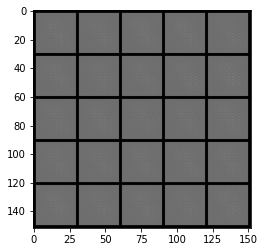

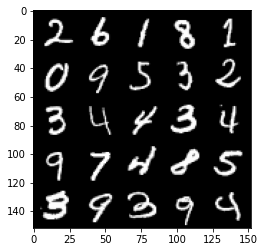

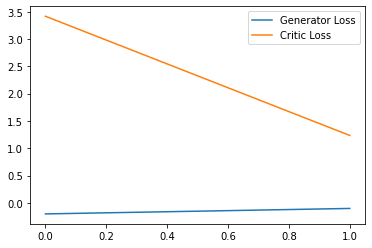

Step 100: Generator loss: 2.118412283360958, critic loss: -3.727758743524552


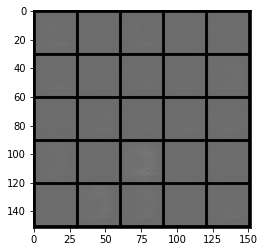

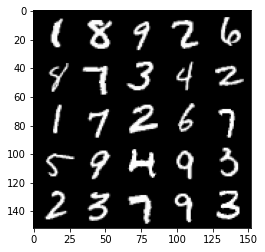

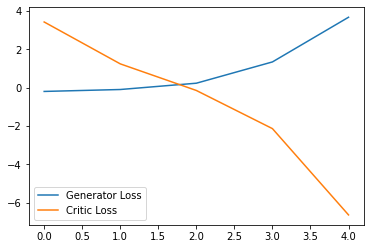

Step 150: Generator loss: 1.6239943408966064, critic loss: -12.700889678955079


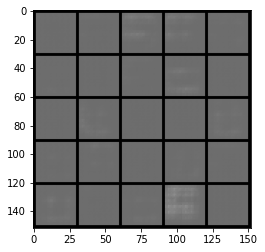

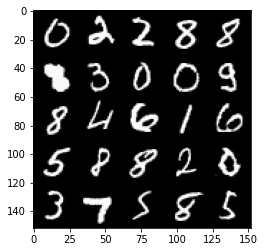

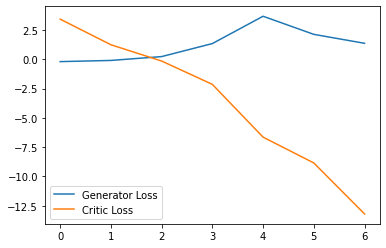

Step 200: Generator loss: 2.136540403366089, critic loss: -33.66332527160644


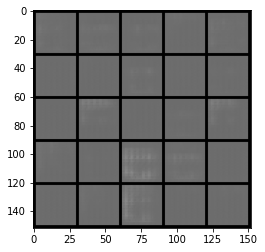

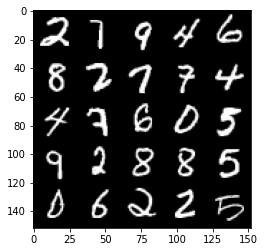

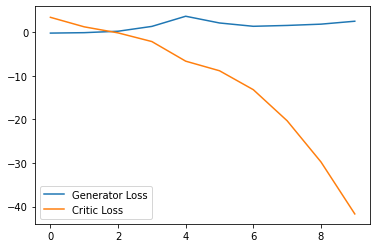

Step 250: Generator loss: 2.3249787974357603, critic loss: -68.18567640686037


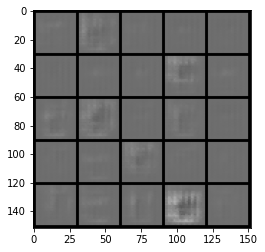

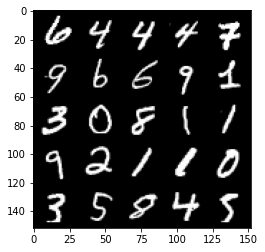

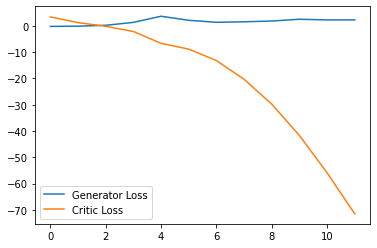

Step 300: Generator loss: 4.194386564493179, critic loss: -112.41981704711911


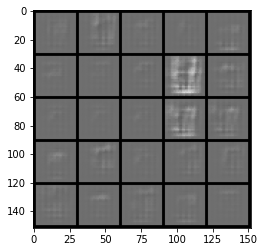

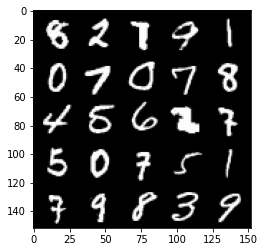

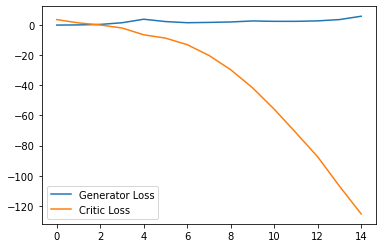

Step 350: Generator loss: 6.437773566246033, critic loss: -163.13977182006835


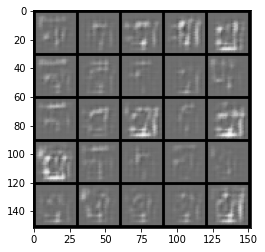

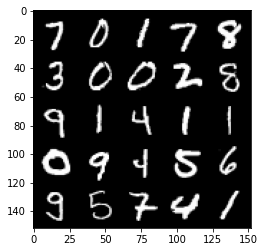

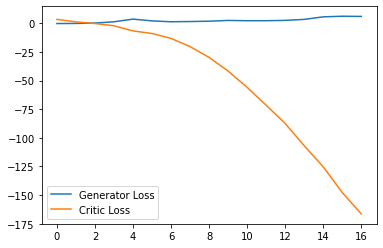

Step 400: Generator loss: -0.8241867834329605, critic loss: -166.1300016479492


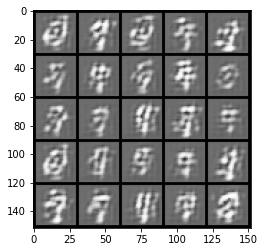

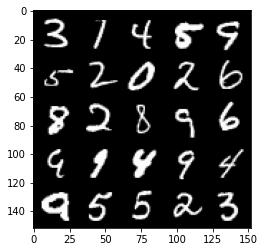

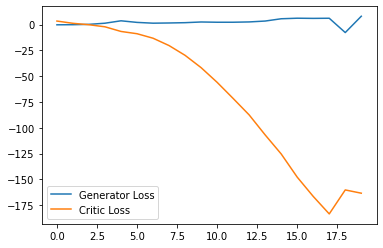

Step 450: Generator loss: 1.5225943487882614, critic loss: -165.220736541748


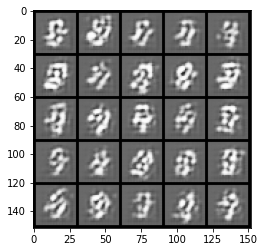

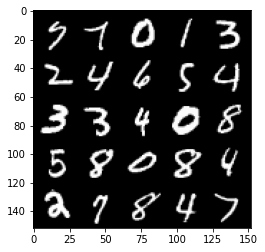

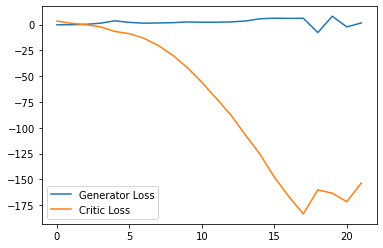

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 17.024858665466308, critic loss: -231.53416030883784


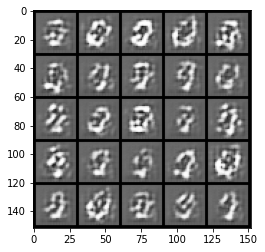

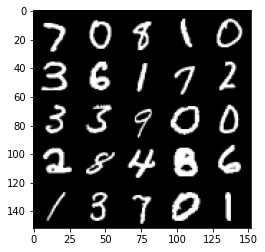

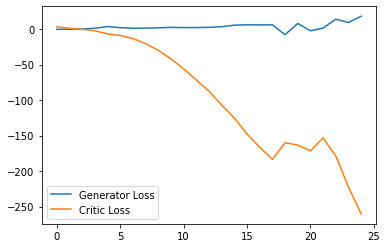

Step 550: Generator loss: 0.5877086472511291, critic loss: -222.74145980834962


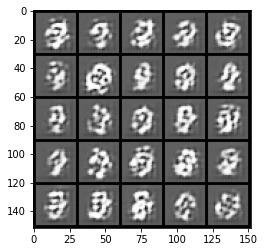

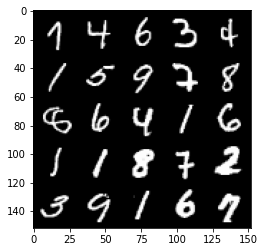

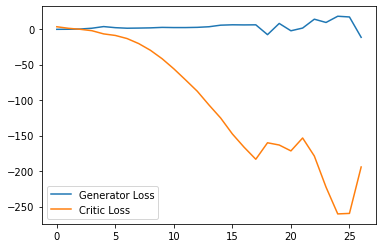

Step 600: Generator loss: 10.892877960205078, critic loss: -253.1886458435058


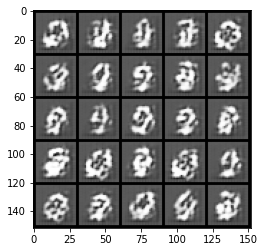

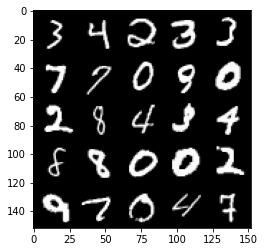

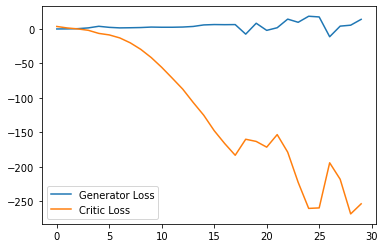

Step 650: Generator loss: -3.2707807779312135, critic loss: -246.43778076171876


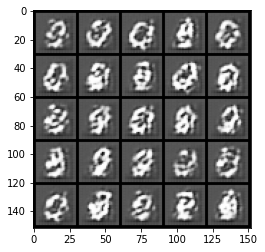

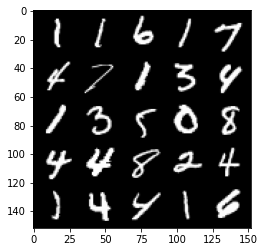

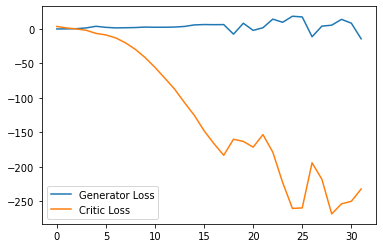

Step 700: Generator loss: -14.142839698791503, critic loss: -238.15287992858893


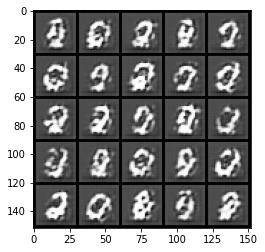

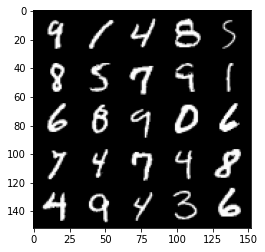

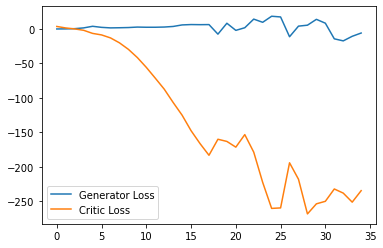

Step 750: Generator loss: -18.008636726140978, critic loss: -244.04375360107423


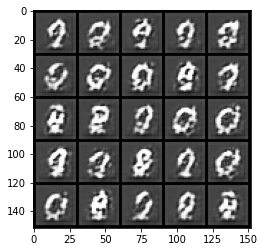

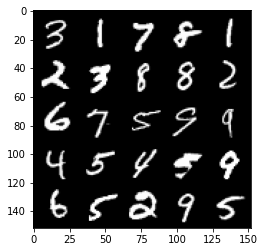

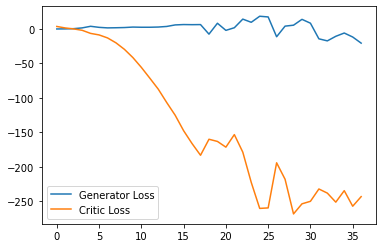

Step 800: Generator loss: -22.080180914402007, critic loss: -151.44695505523686


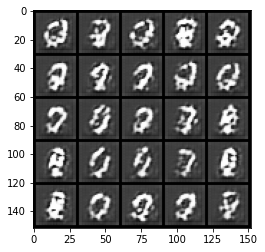

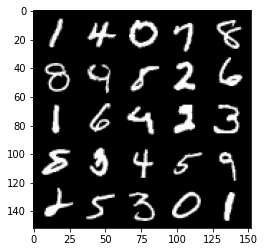

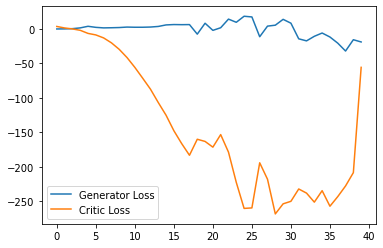

Step 850: Generator loss: -36.51021010398865, critic loss: -170.17840184020992


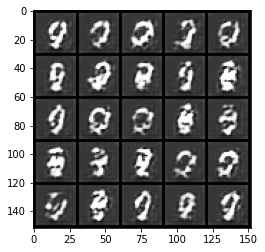

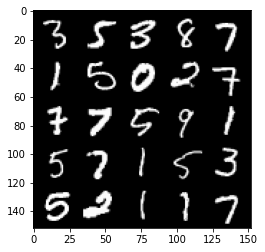

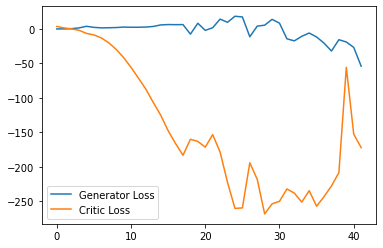

Step 900: Generator loss: -43.9417418217659, critic loss: -155.31711157226565


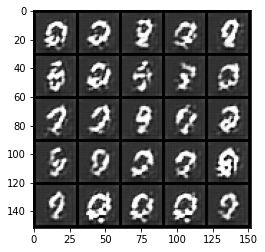

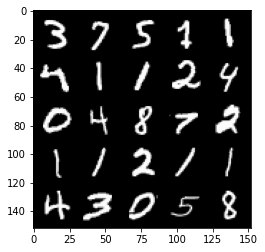

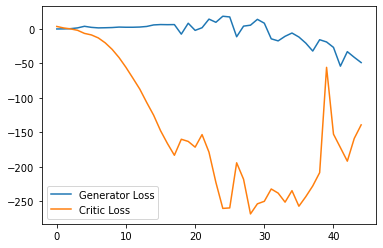

  0%|          | 0/469 [00:00<?, ?it/s]

Step 950: Generator loss: -50.370439453125, critic loss: -126.337848449707


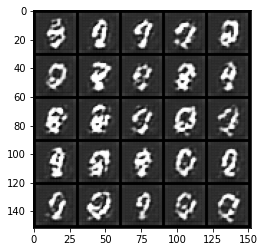

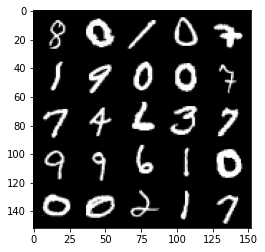

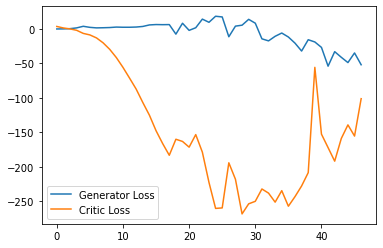

Step 1000: Generator loss: -40.0824716091156, critic loss: -75.14363951873781


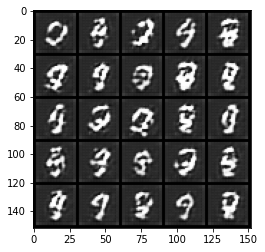

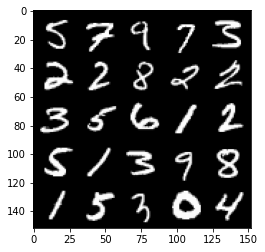

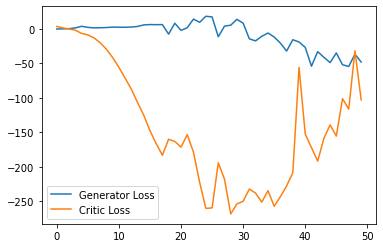

Step 1050: Generator loss: -45.03205467998981, critic loss: -69.81516491699222


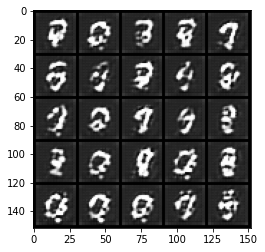

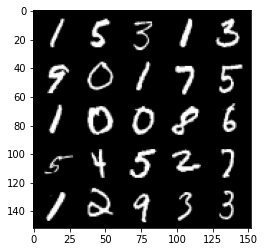

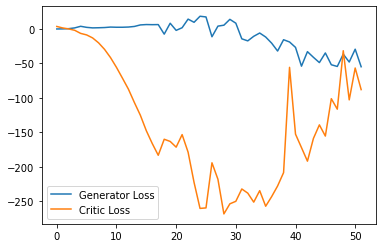

Step 1100: Generator loss: -38.84341463565826, critic loss: -33.9208392791748


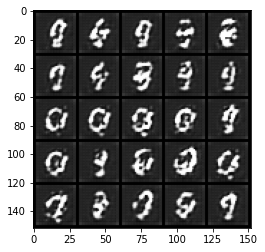

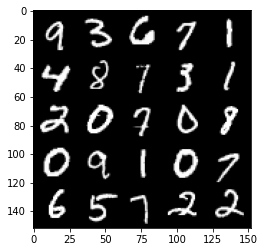

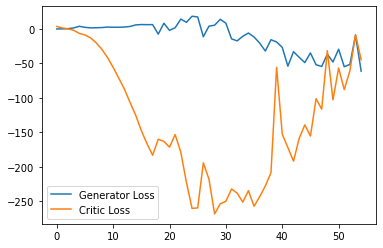

Step 1150: Generator loss: -16.920516500547528, critic loss: 17.797877398490897


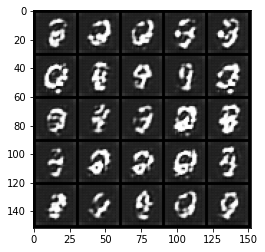

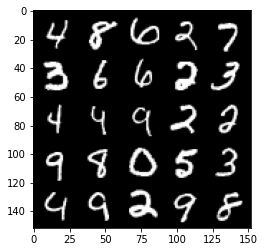

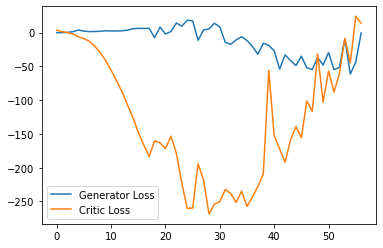

Step 1200: Generator loss: 3.174932403564453, critic loss: 0.5580980310440062


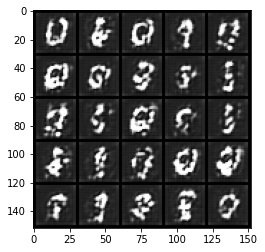

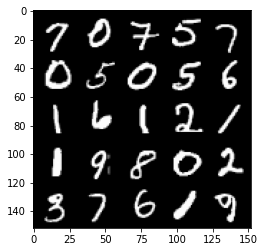

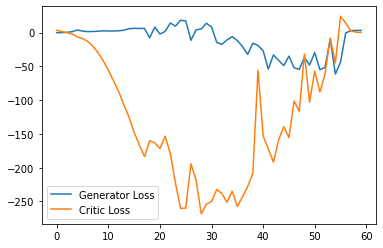

Step 1250: Generator loss: 3.456264338493347, critic loss: 0.5555007791519165


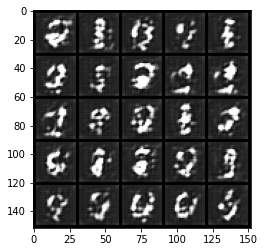

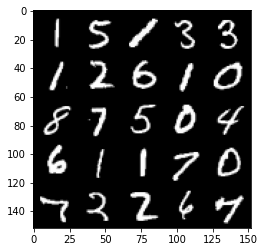

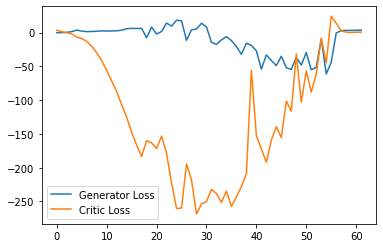

Step 1300: Generator loss: 3.1799136114120485, critic loss: 0.6880817947387695


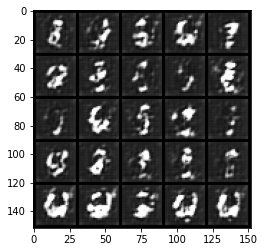

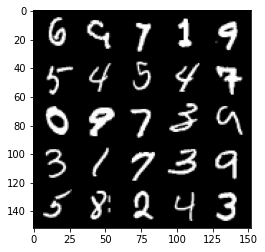

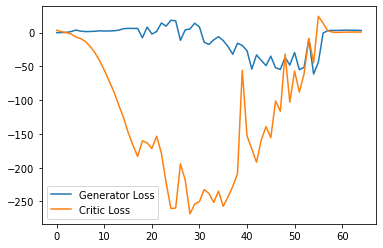

Step 1350: Generator loss: 2.728285565376282, critic loss: 0.4890174207687379


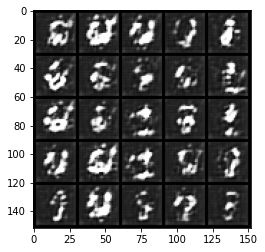

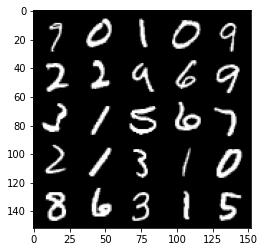

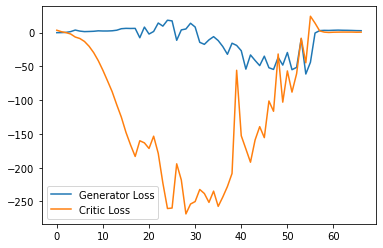

Step 1400: Generator loss: 2.047161567211151, critic loss: -0.06675663995742799


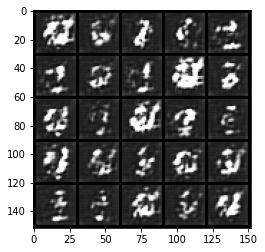

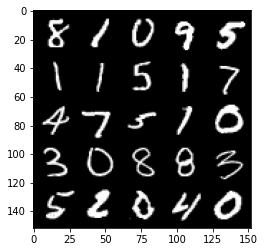

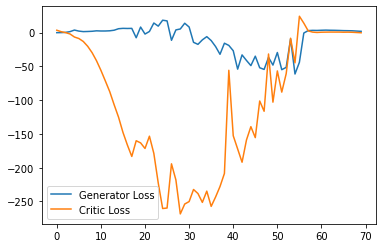

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1450: Generator loss: 1.4016314780712127, critic loss: -0.9689871449470522


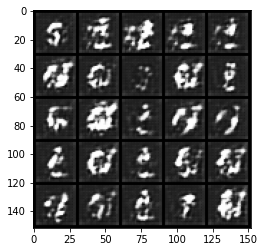

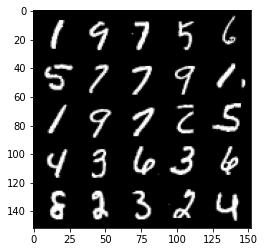

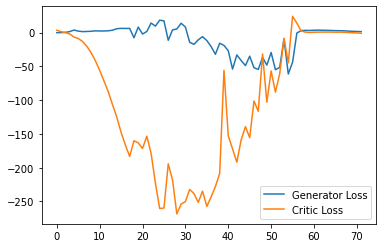

Step 1500: Generator loss: 0.43137750871479513, critic loss: -1.605251419067383


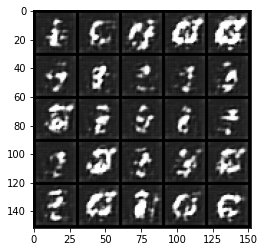

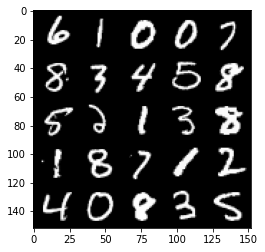

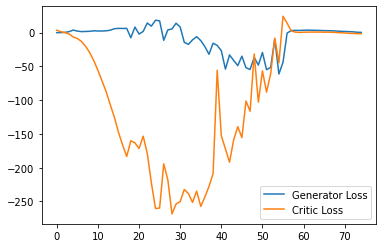

Step 1550: Generator loss: -0.3405007406324148, critic loss: -2.0651874046325696


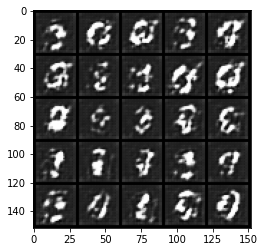

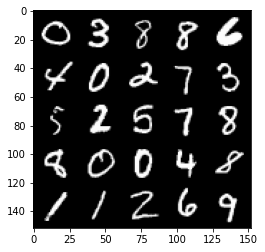

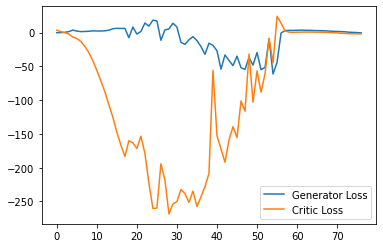

Step 1600: Generator loss: -0.5917882354557514, critic loss: -2.623968725681306


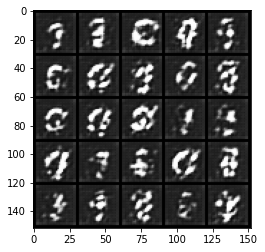

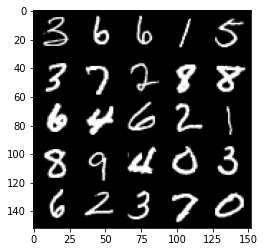

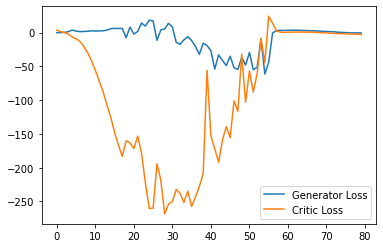

Step 1650: Generator loss: -0.5124151031672954, critic loss: -3.162330978393554


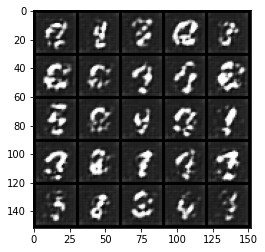

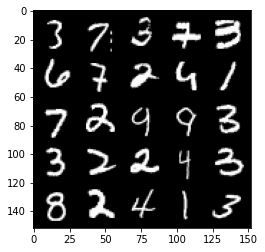

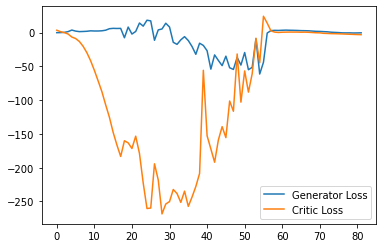

Step 1700: Generator loss: -1.2853973349928856, critic loss: -3.5369754352569576


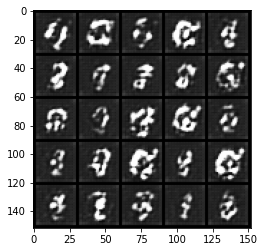

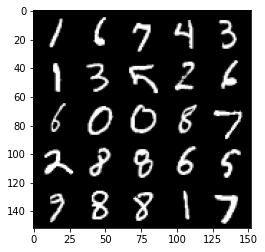

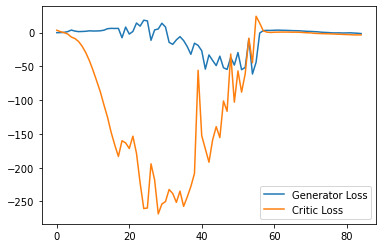

Step 1750: Generator loss: -2.819211497306824, critic loss: -2.9634741239547724


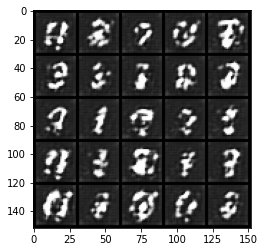

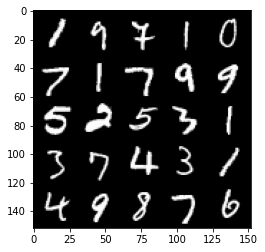

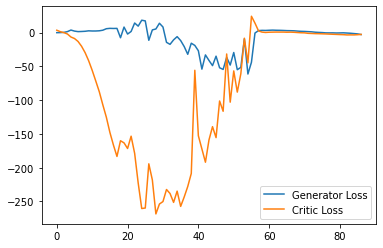

Step 1800: Generator loss: -4.012893877029419, critic loss: -2.3856141138076783


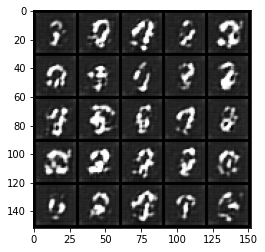

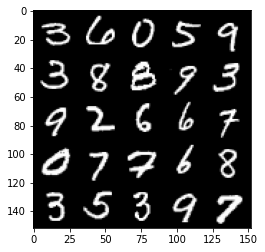

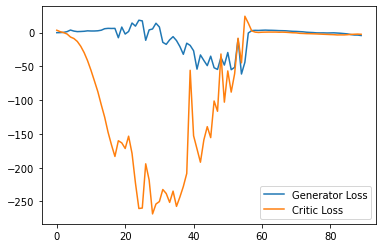

Step 1850: Generator loss: -6.319804711341858, critic loss: -2.3618915557861326


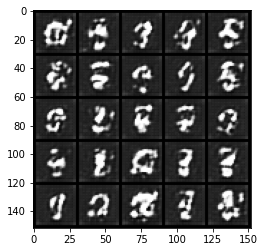

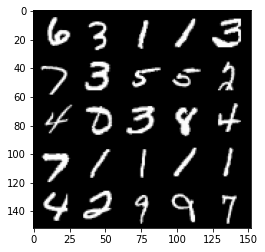

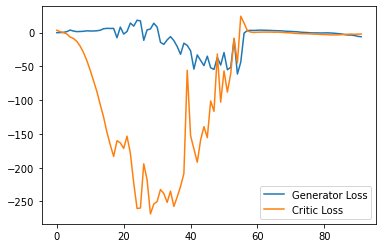

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1900: Generator loss: -7.2770396900177, critic loss: -3.476846097946167


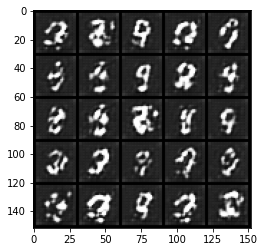

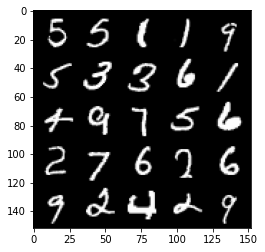

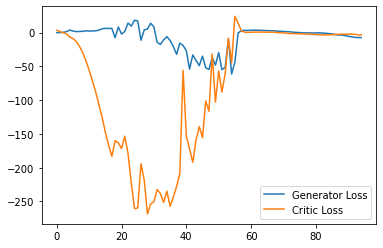

Step 1950: Generator loss: -7.260560898184776, critic loss: -5.686509937286376


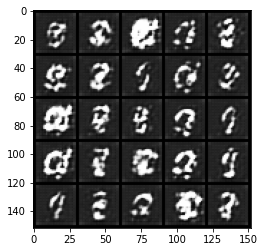

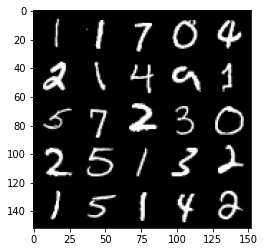

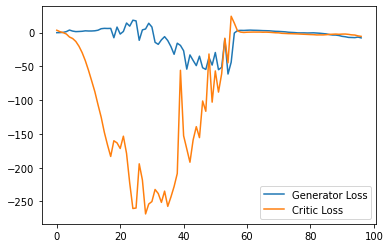

Step 2000: Generator loss: -5.542772071957589, critic loss: -8.424699424743654


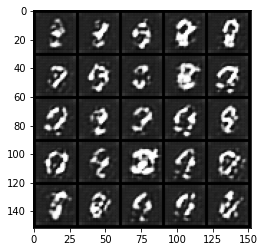

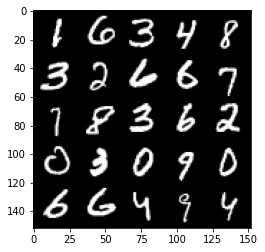

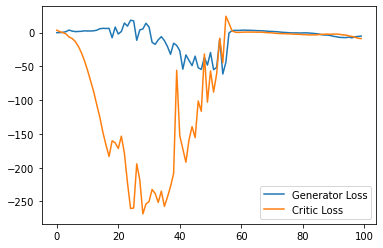

Step 2050: Generator loss: -4.472489897161722, critic loss: -10.640076417922973


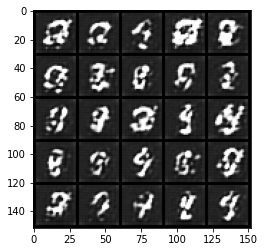

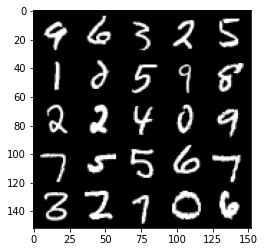

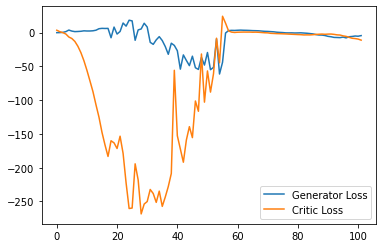

Step 2100: Generator loss: -2.9630486992001535, critic loss: -13.054466207504271


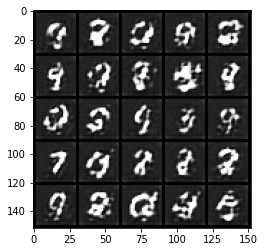

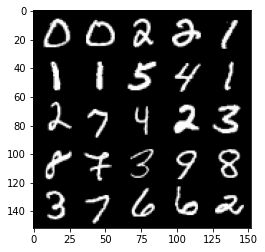

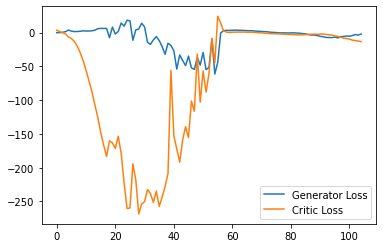

Step 2150: Generator loss: -1.7955984890460968, critic loss: -13.50627132606506


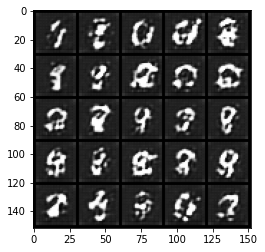

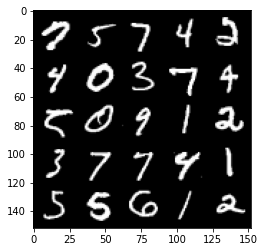

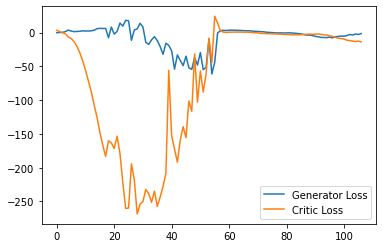

Step 2200: Generator loss: -1.8031369826197625, critic loss: -14.802780002593998


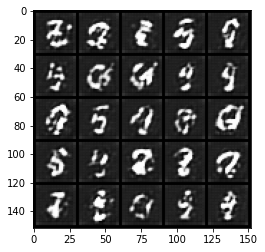

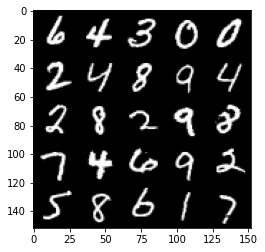

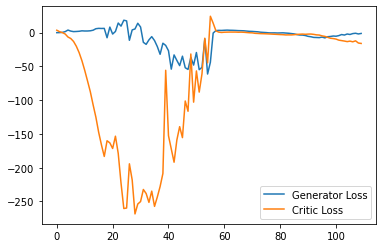

Step 2250: Generator loss: -1.1720302361249924, critic loss: -15.740642778396602


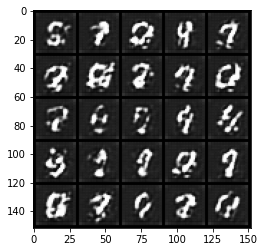

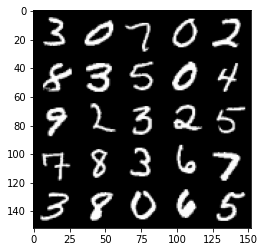

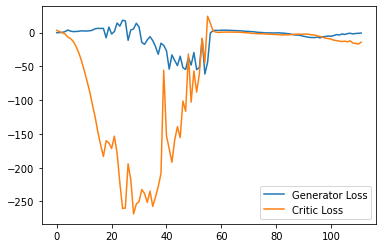

Step 2300: Generator loss: -2.5245823021233083, critic loss: -16.532567455291748


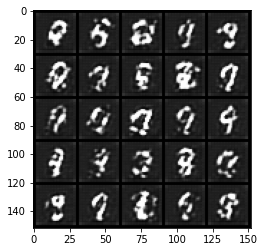

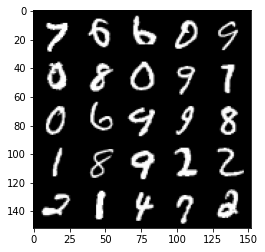

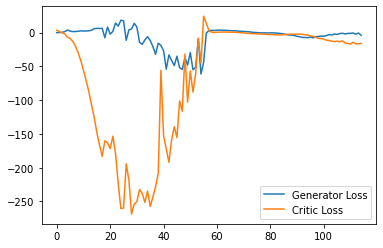

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2350: Generator loss: -1.4074301248788834, critic loss: -18.47847708892822


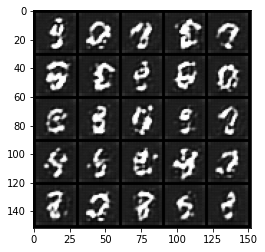

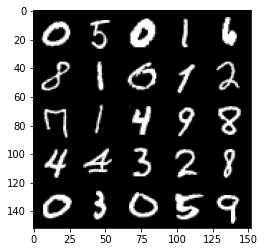

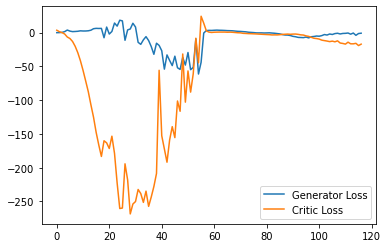

Step 2400: Generator loss: -1.966221421211958, critic loss: -19.810471576690677


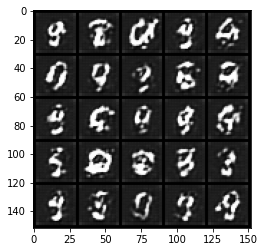

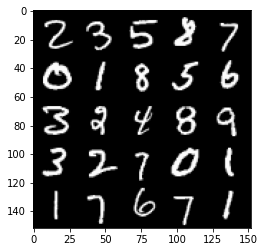

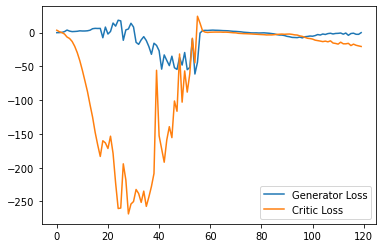

Step 2450: Generator loss: -3.127138394266367, critic loss: -20.89862454223633


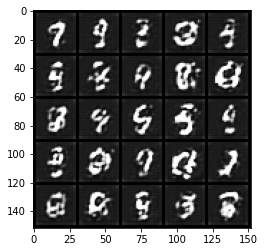

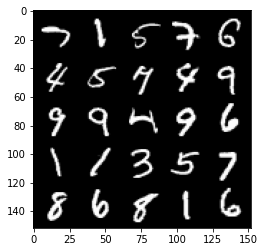

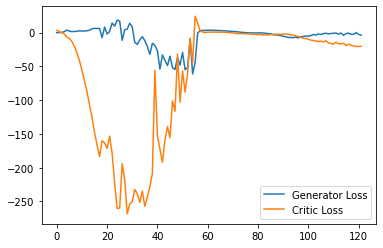

Step 2500: Generator loss: -3.3198400431871415, critic loss: -21.784604742050174


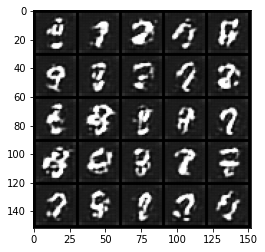

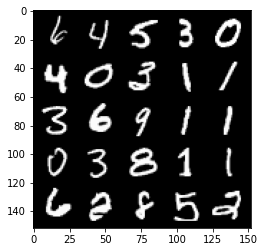

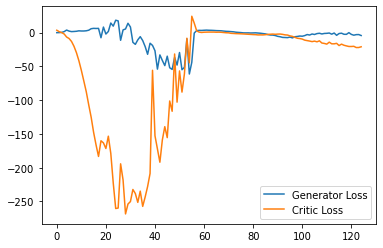

Step 2550: Generator loss: -2.8257442724704744, critic loss: -22.121713443756104


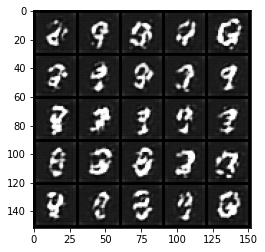

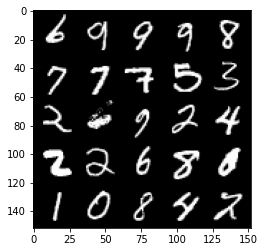

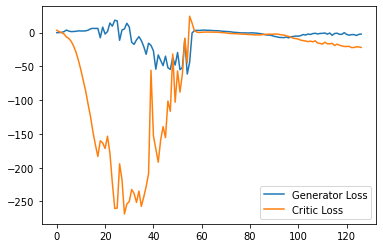

Step 2600: Generator loss: -4.84971190571785, critic loss: -22.096235662460327


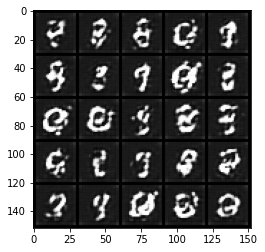

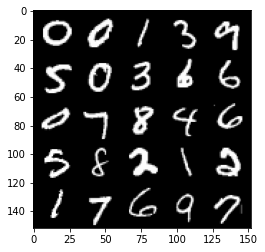

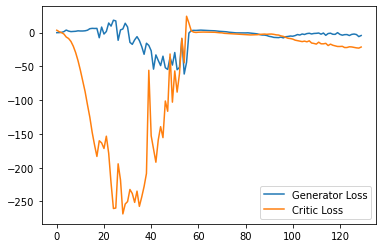

Step 2650: Generator loss: -4.920404853522777, critic loss: -22.401733051300052


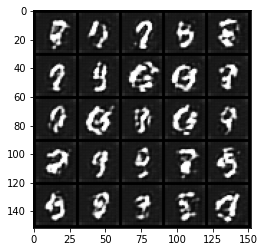

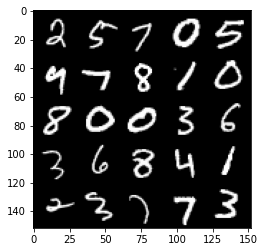

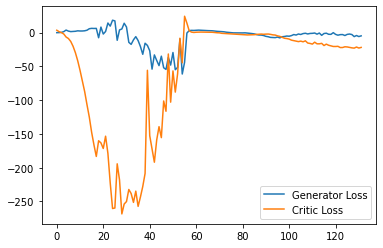

Step 2700: Generator loss: -4.295315569639206, critic loss: -22.697123716354362


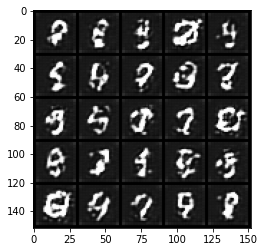

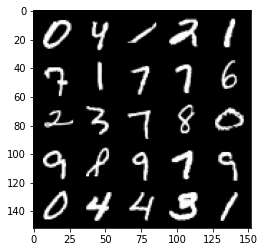

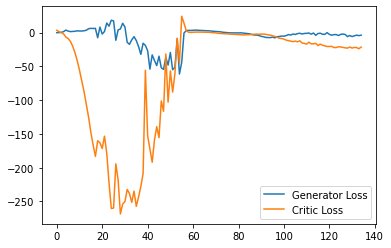

Step 2750: Generator loss: -3.1763768553733827, critic loss: -21.18842276573181


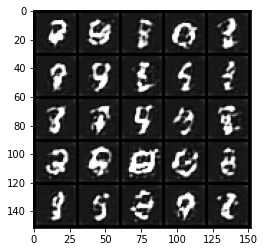

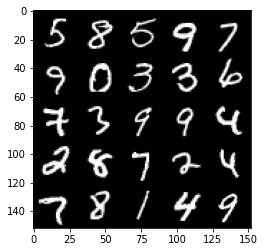

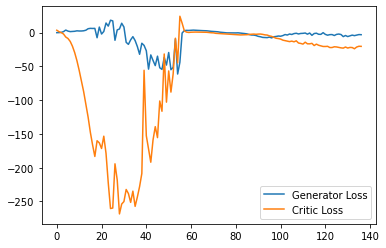

Step 2800: Generator loss: -4.126461541056633, critic loss: -22.503434175491336


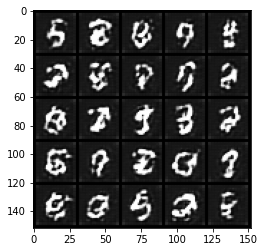

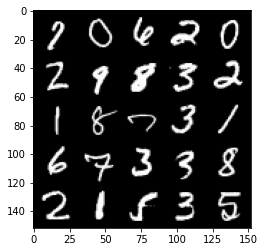

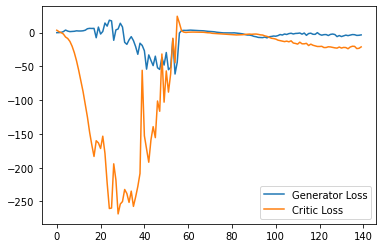

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2850: Generator loss: -2.7666721299290655, critic loss: -20.4257156047821


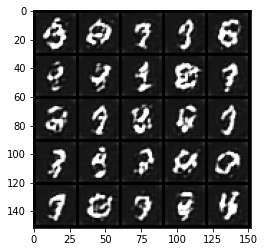

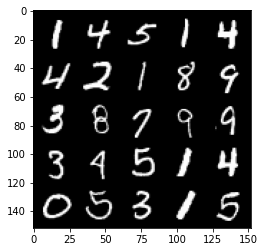

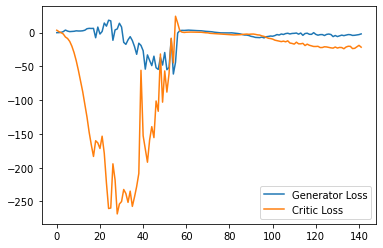

Step 2900: Generator loss: -1.9167119014263152, critic loss: -21.001449845314028


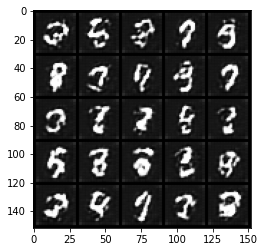

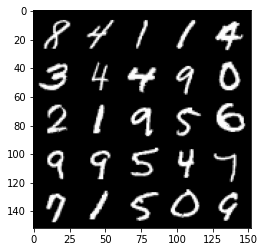

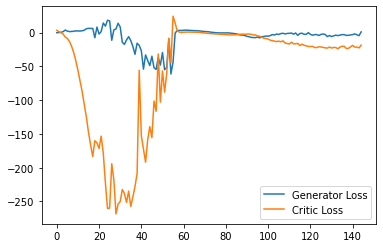

Step 2950: Generator loss: -2.179524415284395, critic loss: -22.657642019271844


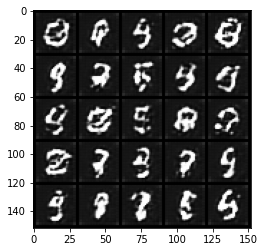

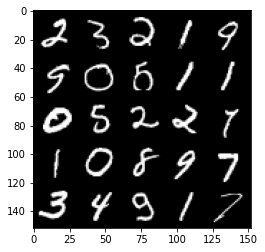

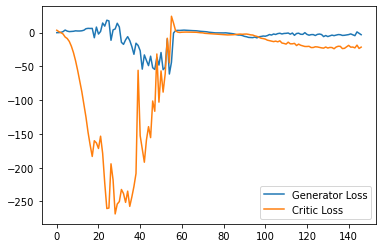

Step 3000: Generator loss: -1.1715218955278397, critic loss: -20.71183193778992


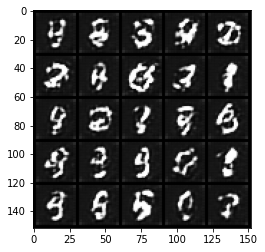

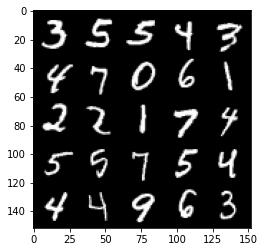

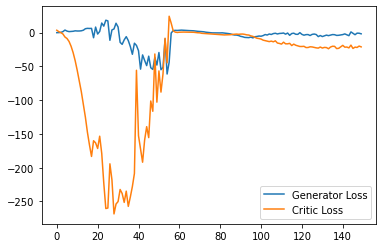

Step 3050: Generator loss: 2.1856443786621096, critic loss: -11.51454453468323


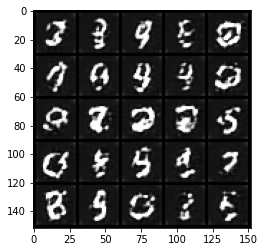

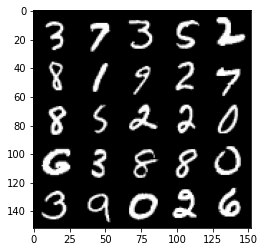

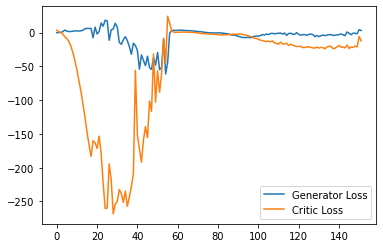

Step 3100: Generator loss: -2.1025989893078805, critic loss: -20.55663194942475


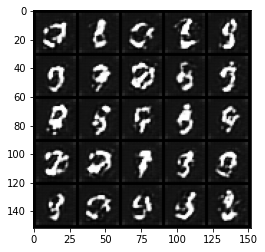

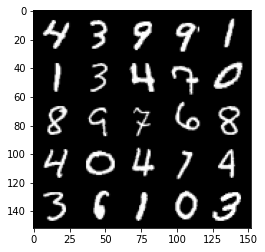

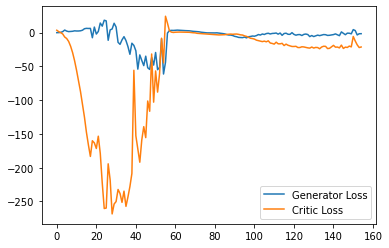

Step 3150: Generator loss: 0.14143048405647277, critic loss: -17.905849534034736


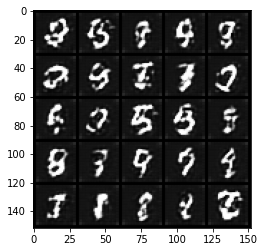

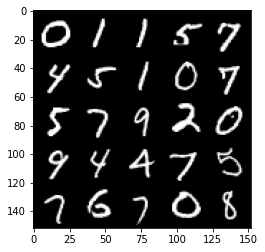

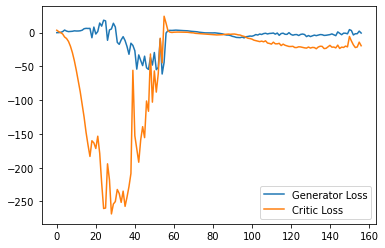

Step 3200: Generator loss: -0.48008000522851946, critic loss: -18.33461462688446


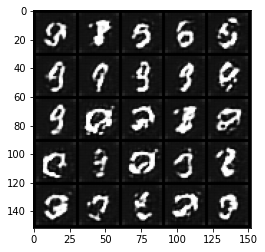

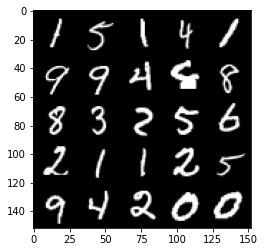

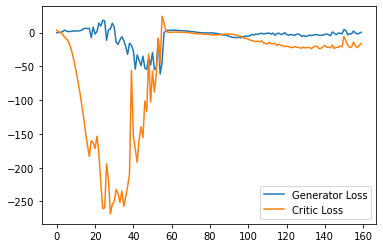

Step 3250: Generator loss: 3.5201846706867217, critic loss: -9.322826920509335


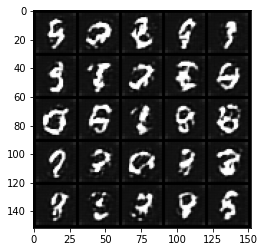

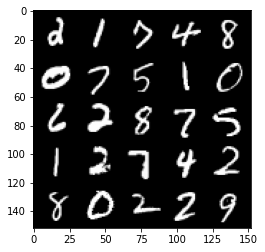

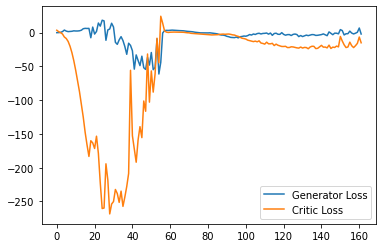

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3300: Generator loss: 3.0354154105484485, critic loss: -10.453114951133728


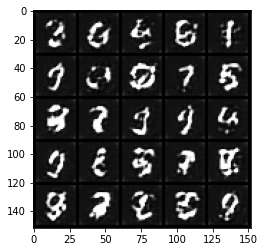

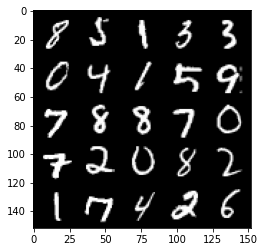

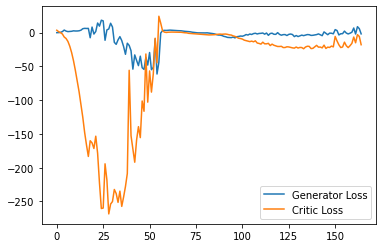

Step 3350: Generator loss: -1.1326433785259724, critic loss: -18.87325019073486


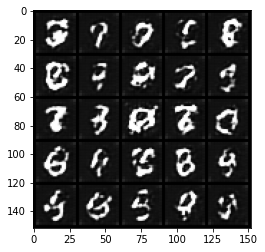

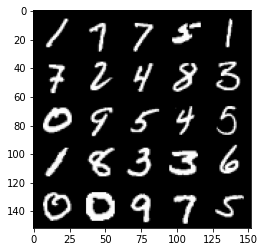

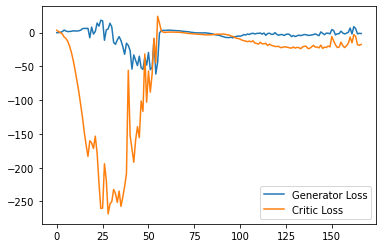

Step 3400: Generator loss: 0.7271692830324173, critic loss: -18.60419773387909


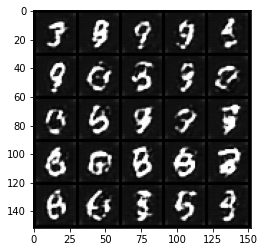

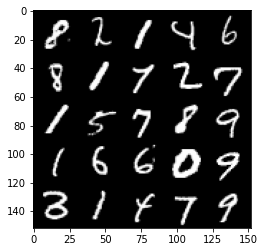

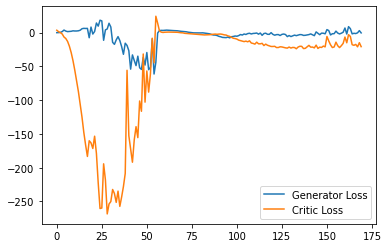

Step 3450: Generator loss: 0.7167294862866401, critic loss: -18.912014877796175


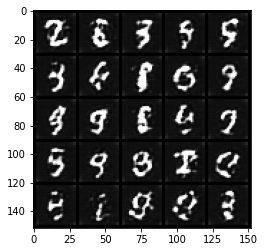

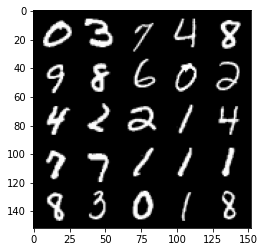

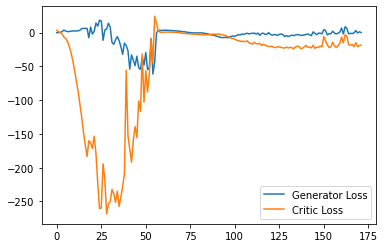

Step 3500: Generator loss: 3.808876636624336, critic loss: -8.577215126991273


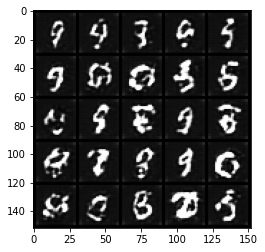

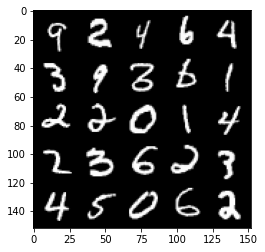

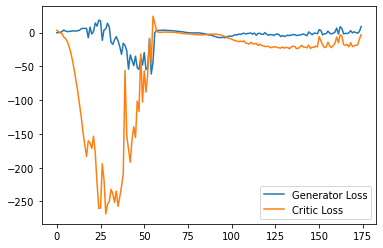

Step 3550: Generator loss: 1.9850424432754517, critic loss: -11.39886091423035


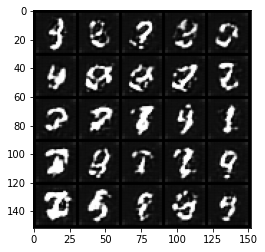

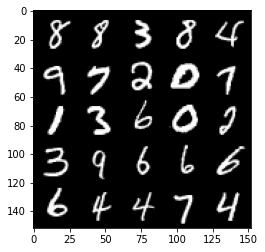

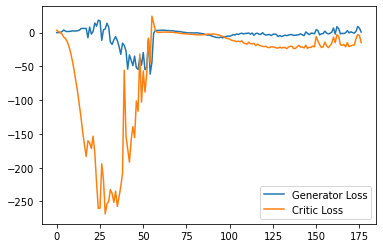

Step 3600: Generator loss: -1.758464603573084, critic loss: -18.685367262840273


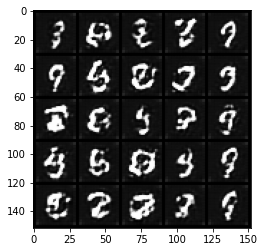

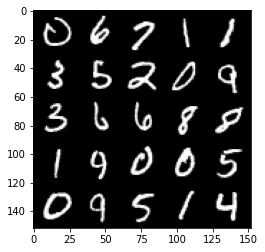

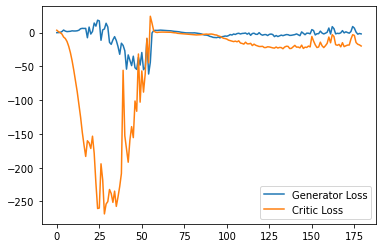

Step 3650: Generator loss: 5.714200235009193, critic loss: -7.221910471916199


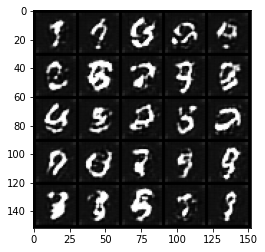

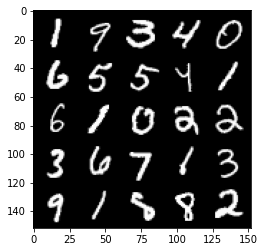

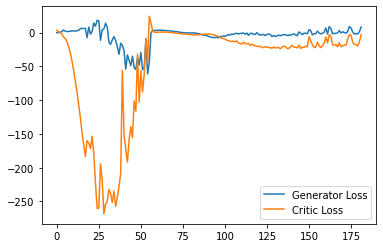

Step 3700: Generator loss: -1.2379984456300734, critic loss: -17.44839367103577


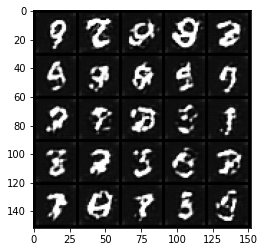

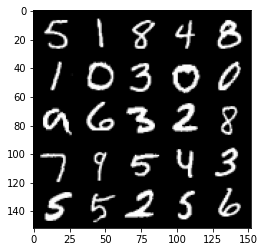

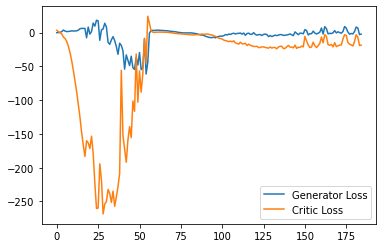

Step 3750: Generator loss: 2.862962898015976, critic loss: -10.010005577087401


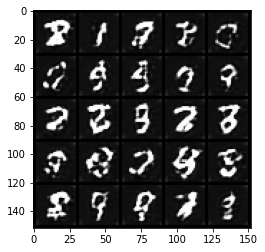

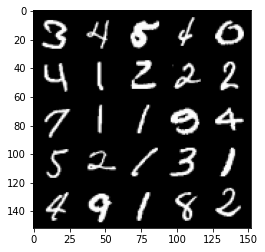

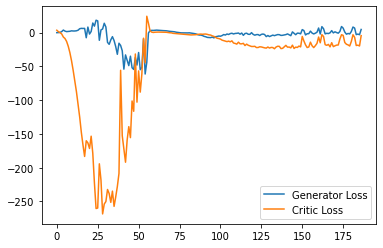

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3800: Generator loss: 7.89112268447876, critic loss: -3.49999568939209


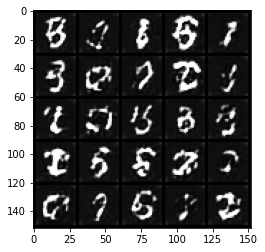

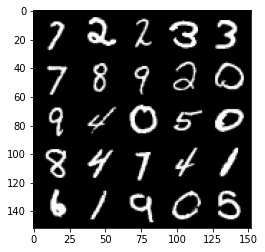

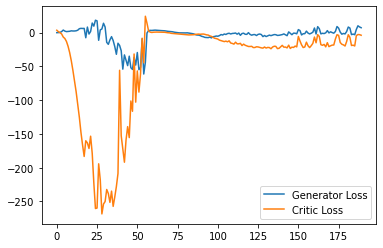

Step 3850: Generator loss: -1.6845404839515685, critic loss: -13.549644522666927


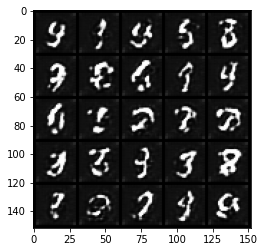

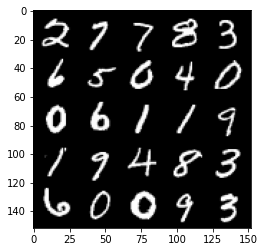

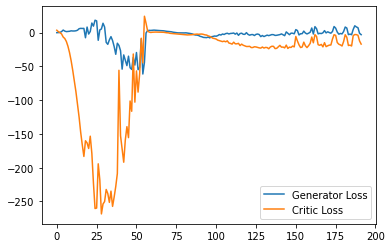

Step 3900: Generator loss: 1.7953741598129271, critic loss: -15.604628811836239


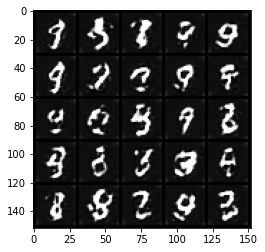

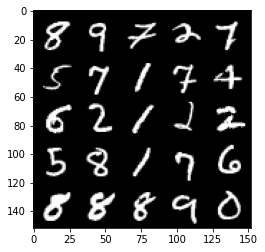

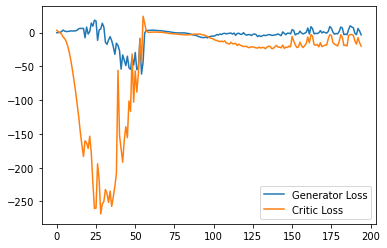

Step 3950: Generator loss: 0.06734046399593353, critic loss: -15.121470149993893


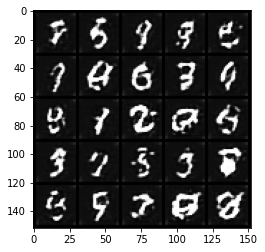

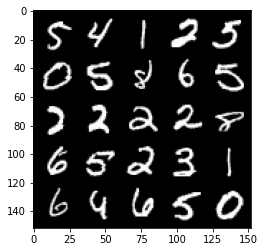

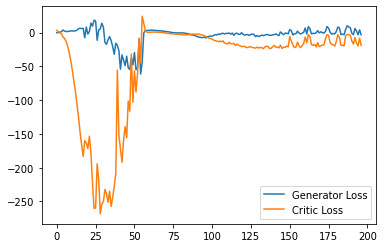

Step 4000: Generator loss: 0.8714052775502205, critic loss: -9.237546898126595


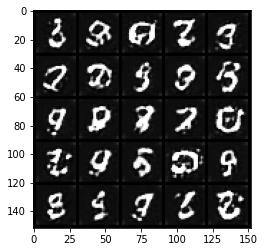

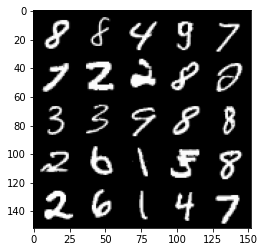

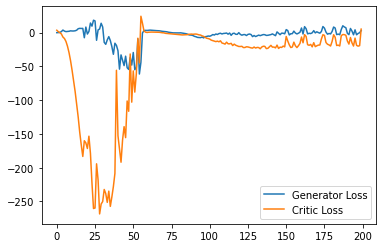

Step 4050: Generator loss: 7.616063718795776, critic loss: -2.2759275569915767


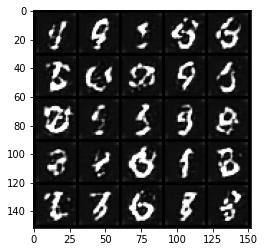

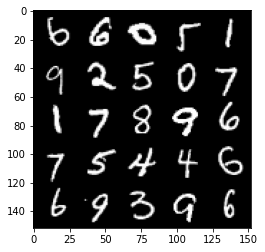

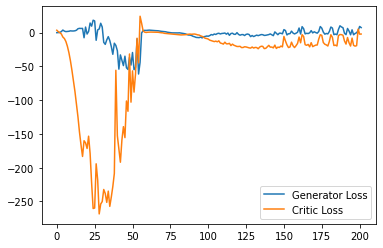

Step 4100: Generator loss: 4.472919883728028, critic loss: -2.197754792690277


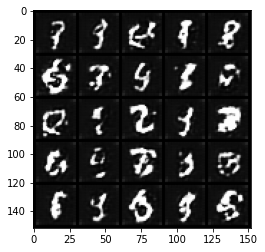

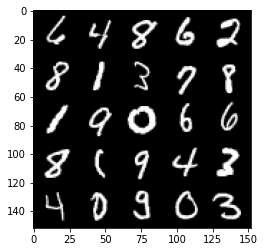

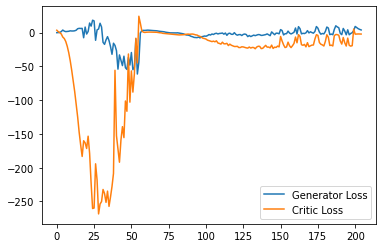

Step 4150: Generator loss: 2.991962723731995, critic loss: -2.7021240072250365


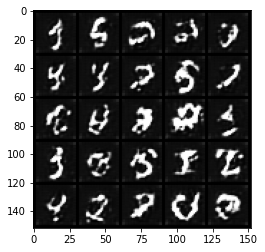

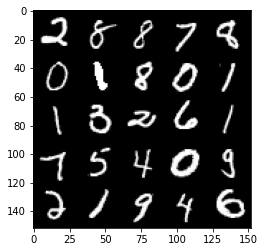

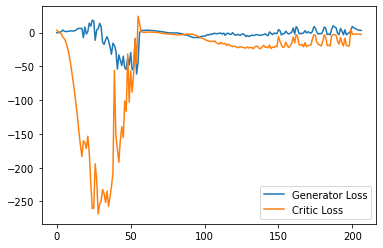

Step 4200: Generator loss: 1.8970001530647278, critic loss: -3.340538356781005


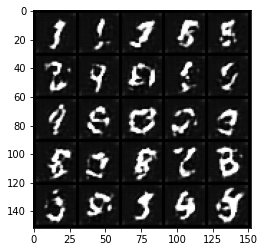

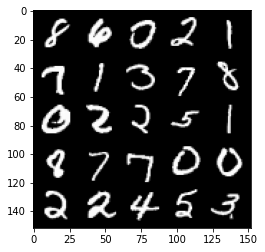

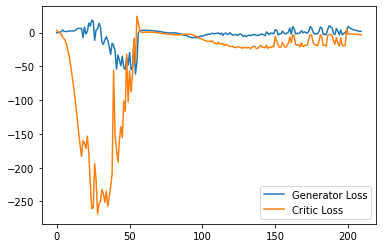

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4250: Generator loss: 1.3747081941366195, critic loss: -4.0966212854385375


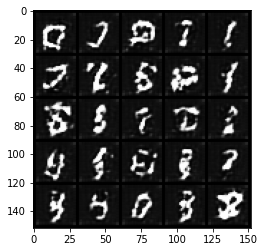

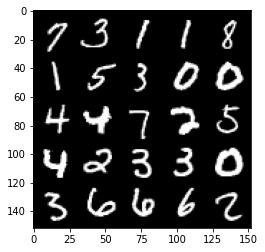

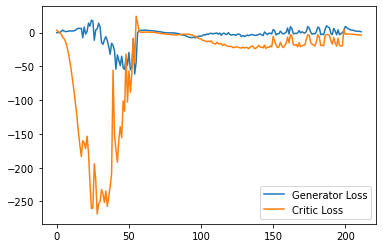

Step 4300: Generator loss: -3.7211359214782713, critic loss: -11.800854670524597


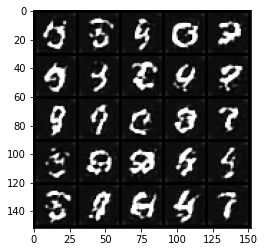

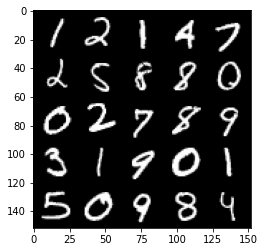

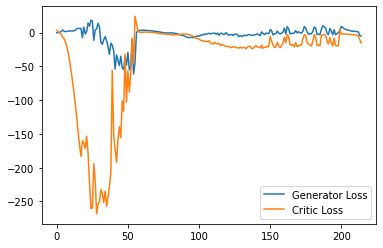

Step 4350: Generator loss: -0.45343961715698244, critic loss: -0.19455785560607808


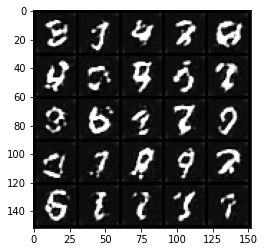

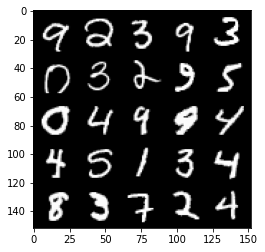

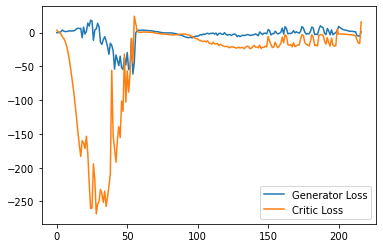

Step 4400: Generator loss: 3.721167974472046, critic loss: -2.2693365154266356


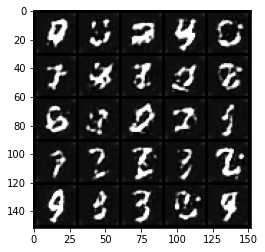

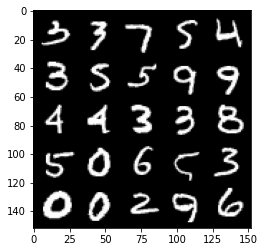

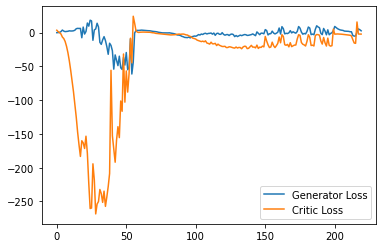

Step 4450: Generator loss: 1.976632308959961, critic loss: -2.5158657054901123


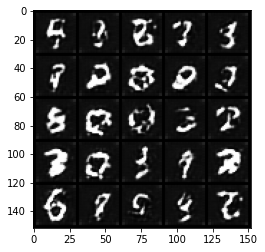

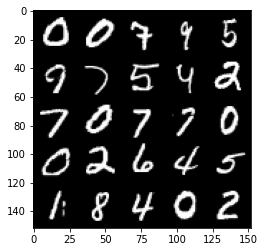

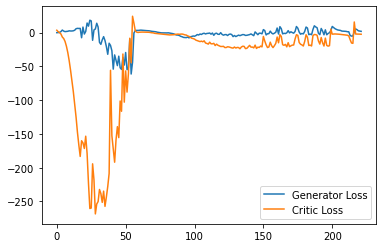

Step 4500: Generator loss: 0.8612224665284157, critic loss: -2.891433325767518


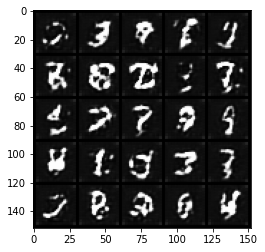

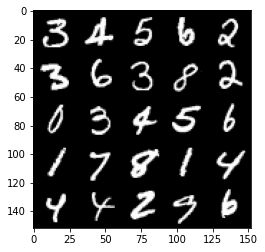

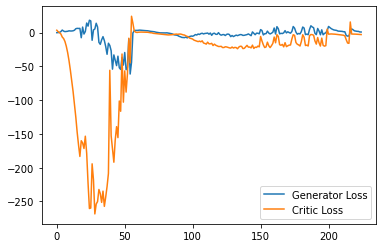

Step 4550: Generator loss: 0.13059315081685782, critic loss: -3.355386977195739


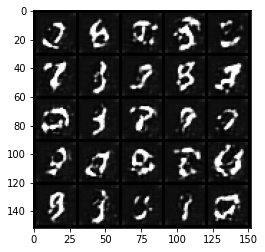

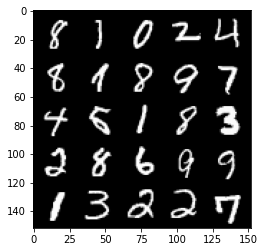

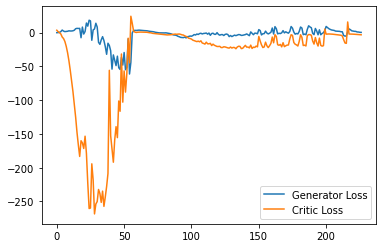

Step 4600: Generator loss: -2.6016515055671334, critic loss: -6.952165546417234


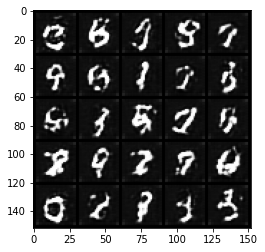

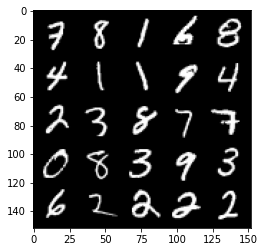

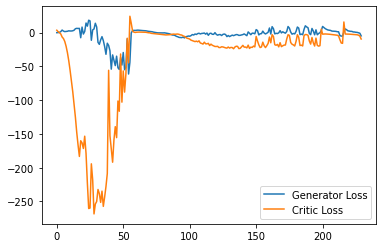

Step 4650: Generator loss: -5.074506034851074, critic loss: -16.624380640029905


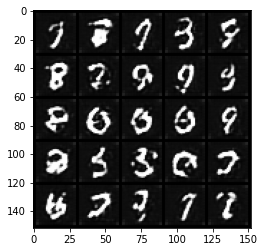

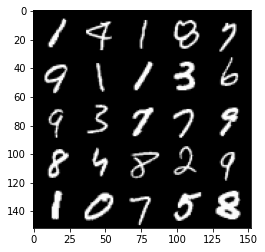

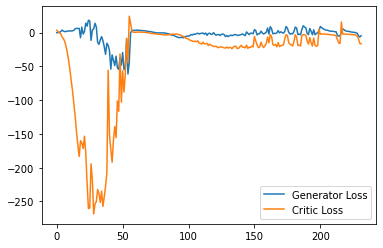

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4700: Generator loss: -2.6602046301960947, critic loss: -16.207512041091917


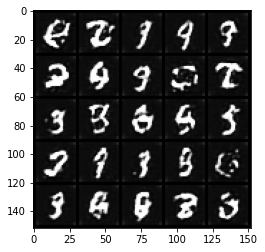

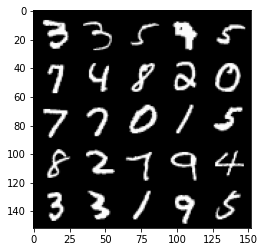

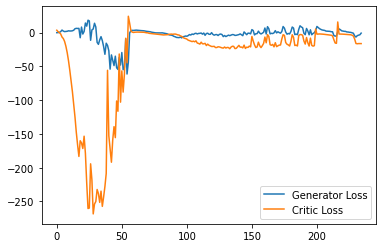

Step 4750: Generator loss: -3.1319382017850876, critic loss: -16.8772680015564


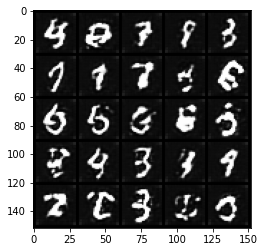

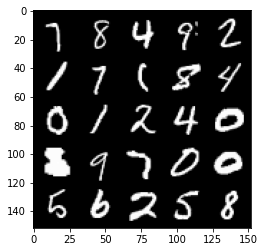

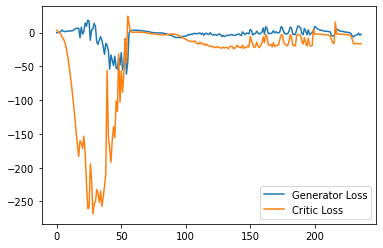

Step 4800: Generator loss: -2.221044006049633, critic loss: -17.395744829177858


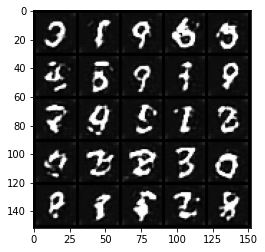

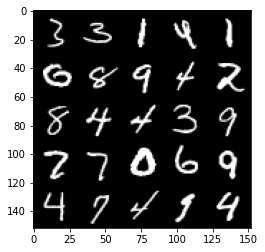

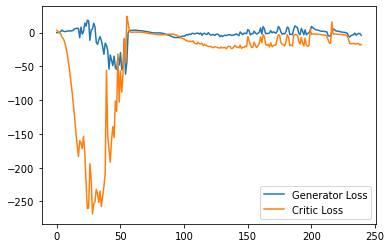

Step 4850: Generator loss: -1.5158727943897248, critic loss: -15.517388860702516


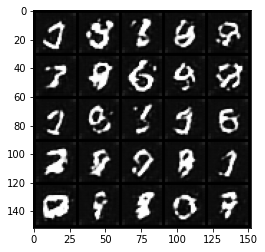

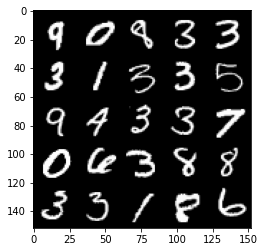

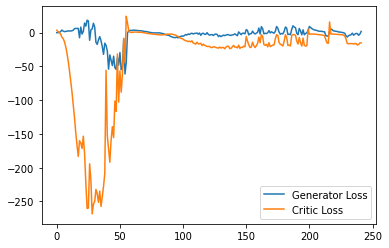

Step 4900: Generator loss: -0.7288787993788719, critic loss: -10.635985206604005


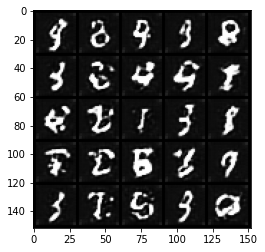

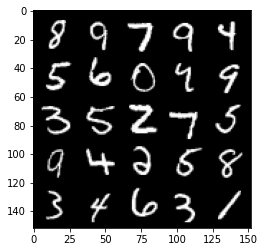

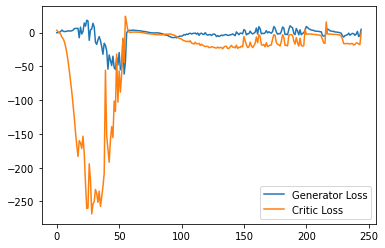

Step 4950: Generator loss: 3.9369453632831575, critic loss: -4.301593547821045


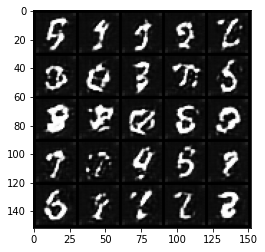

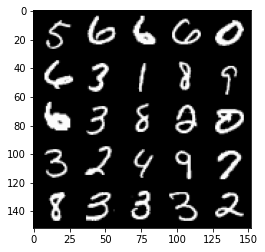

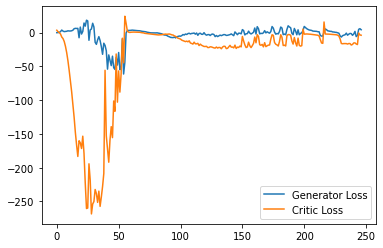

Step 5000: Generator loss: -5.411092361211777, critic loss: -17.329493287086486


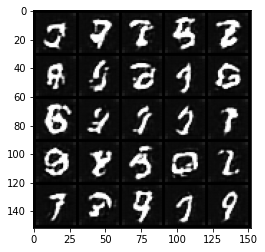

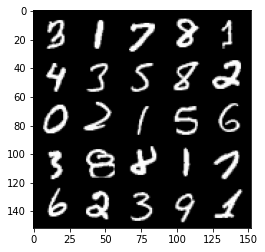

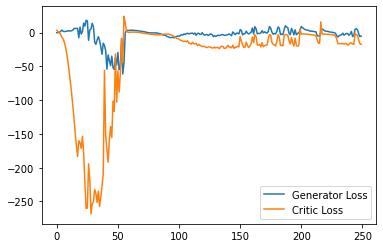

Step 5050: Generator loss: -4.466705287694931, critic loss: -16.816282247543327


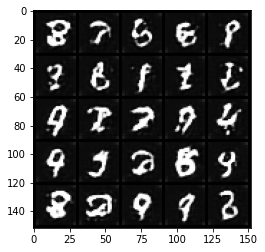

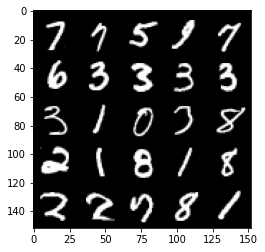

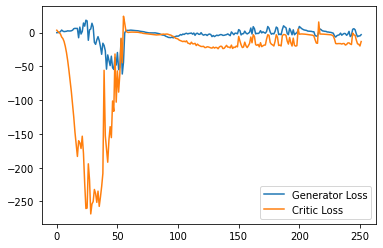

Step 5100: Generator loss: -3.6928828328847887, critic loss: -15.885327173233026


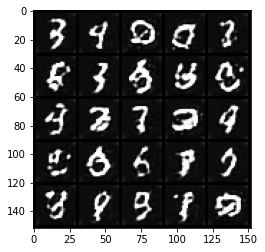

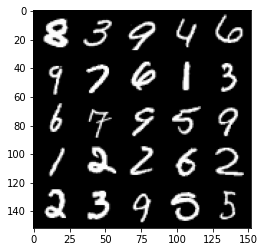

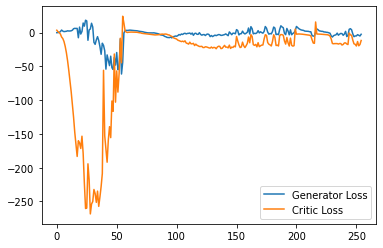

Step 5150: Generator loss: -4.476270661354065, critic loss: -16.102628271579743


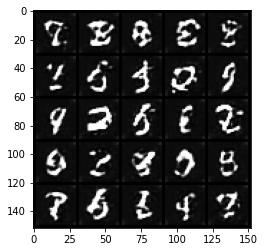

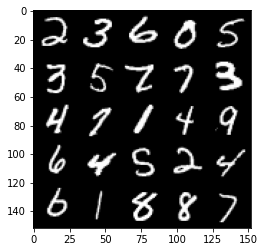

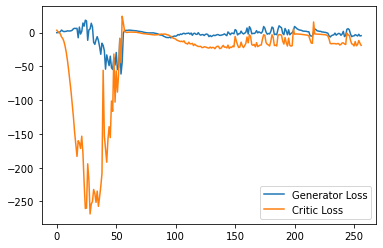

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5200: Generator loss: -3.9883751559257505, critic loss: -16.081384341716763


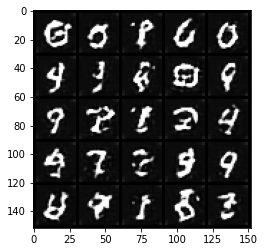

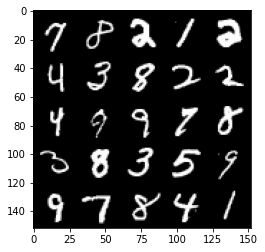

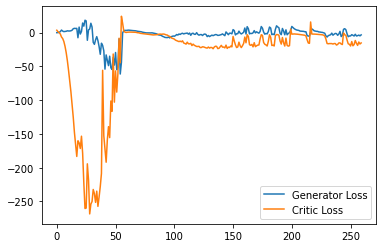

Step 5250: Generator loss: -3.6137188720703124, critic loss: -17.8392283577919


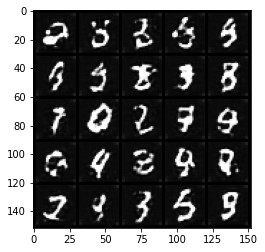

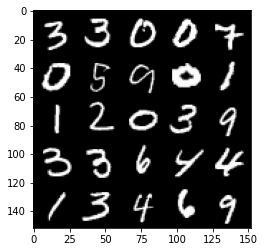

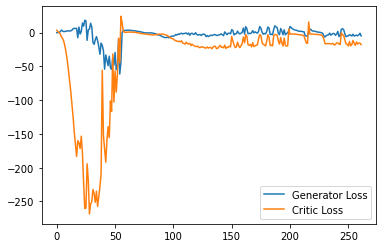

Step 5300: Generator loss: -5.679660620093346, critic loss: -17.287168168067932


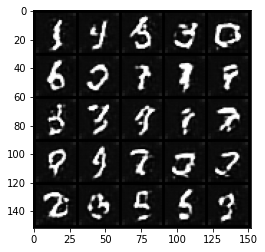

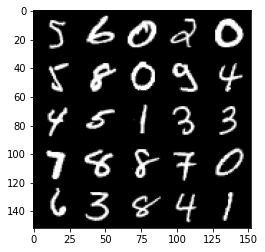

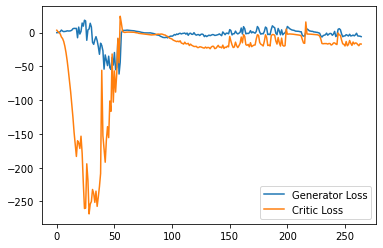

Step 5350: Generator loss: -2.9330898976325988, critic loss: -4.045297342777251


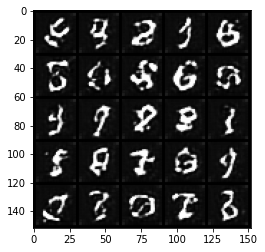

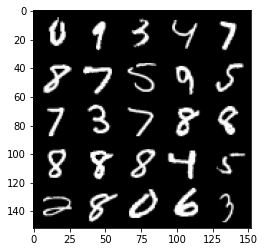

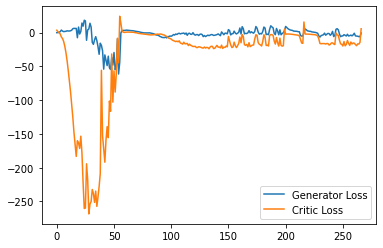

Step 5400: Generator loss: -1.7042832997441293, critic loss: -7.705614893674849


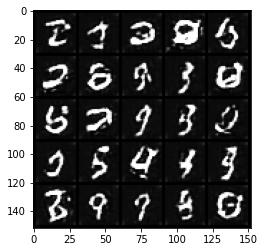

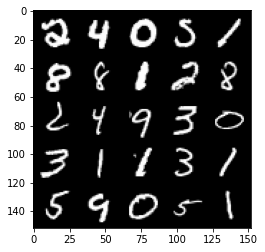

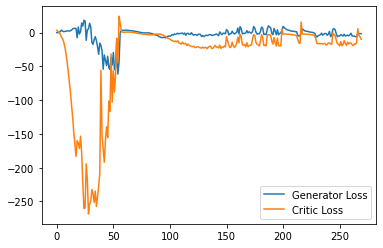

Step 5450: Generator loss: -2.5777078437805176, critic loss: -14.73144013595581


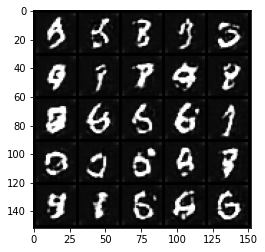

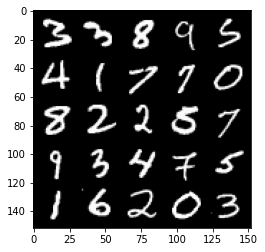

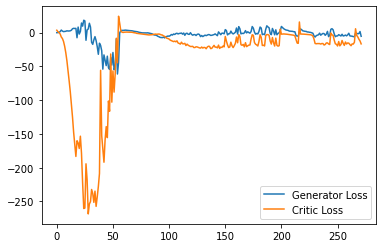

Step 5500: Generator loss: -4.152459447979927, critic loss: -16.270654743194584


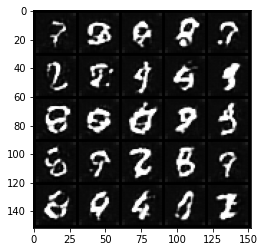

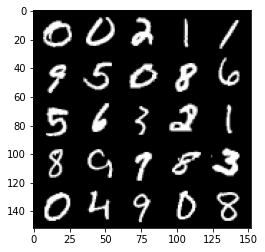

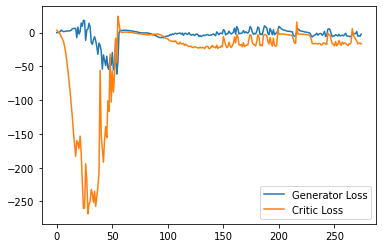

Step 5550: Generator loss: -4.906808087825775, critic loss: -17.529738117218017


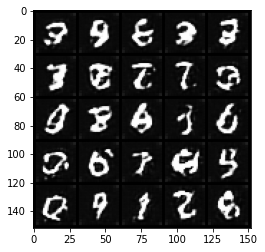

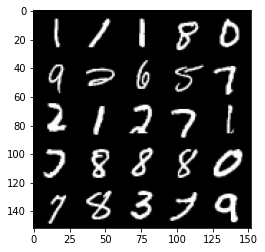

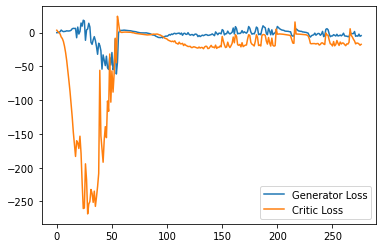

Step 5600: Generator loss: -6.035092843770981, critic loss: -17.381523404121396


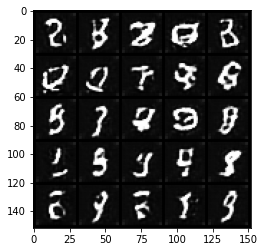

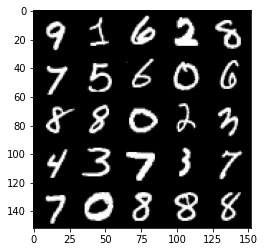

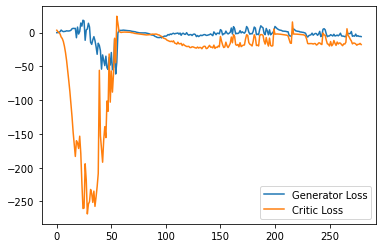

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5650: Generator loss: -2.840358414053917, critic loss: -14.3160231552124


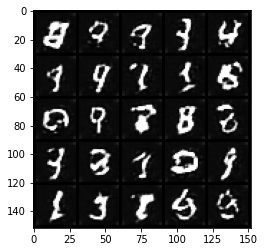

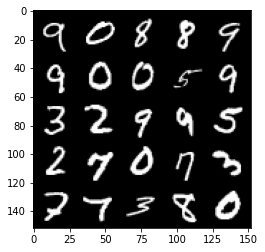

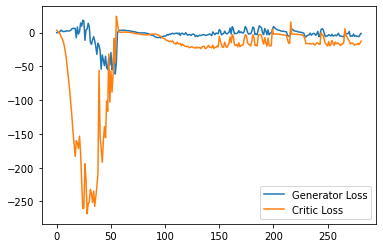

Step 5700: Generator loss: -4.378030835688114, critic loss: -15.867478255271912


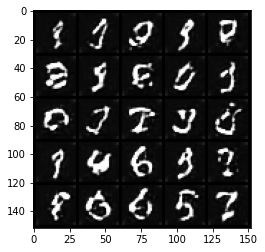

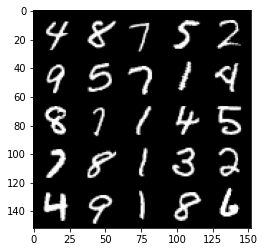

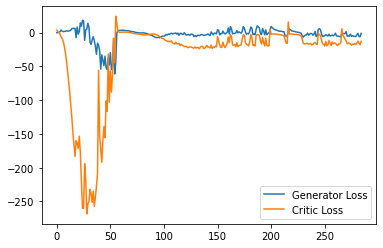

Step 5750: Generator loss: -4.63170111566782, critic loss: -15.975355117797852


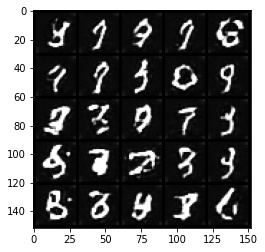

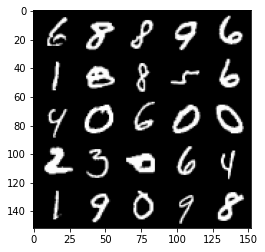

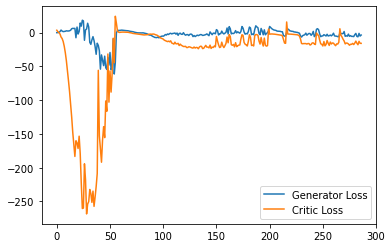

Step 5800: Generator loss: -3.869266623854637, critic loss: -13.744021279335023


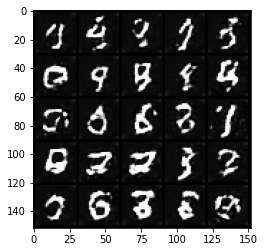

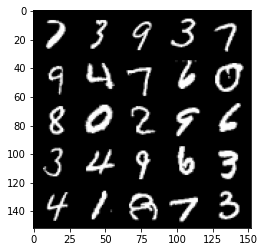

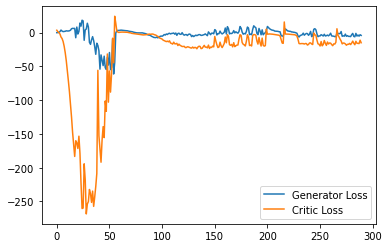

Step 5850: Generator loss: -5.005243751406669, critic loss: -16.7073572101593


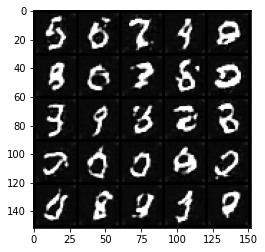

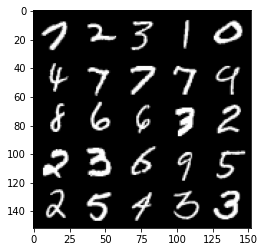

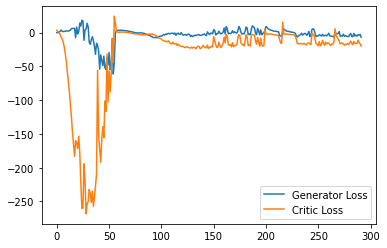

Step 5900: Generator loss: -6.429253553748131, critic loss: -14.186236935615538


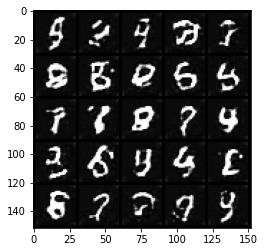

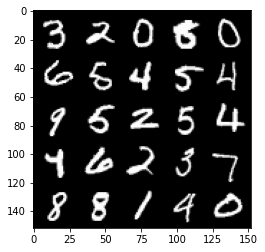

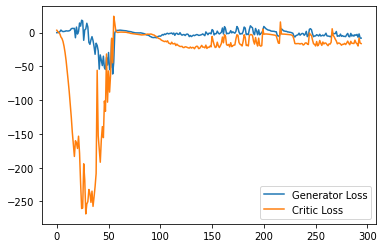

Step 5950: Generator loss: -8.063977026939392, critic loss: -17.698076321125033


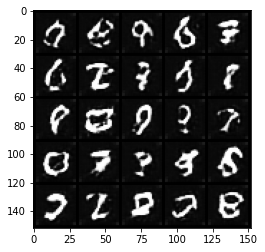

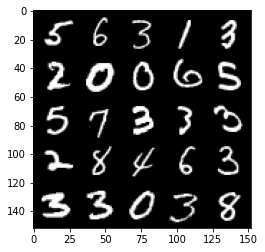

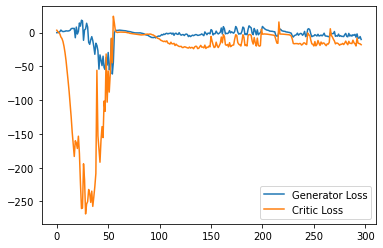

Step 6000: Generator loss: 0.08803863987326623, critic loss: -6.364719582557679


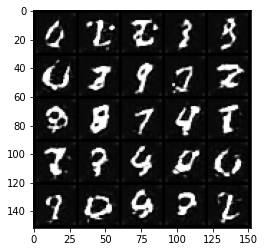

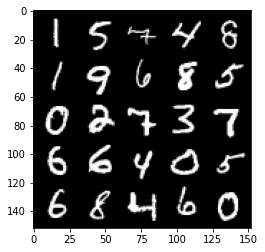

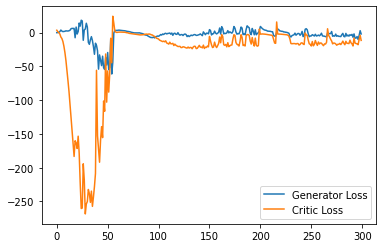

Step 6050: Generator loss: -5.82534604281187, critic loss: -14.315124105453487


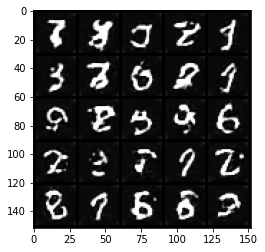

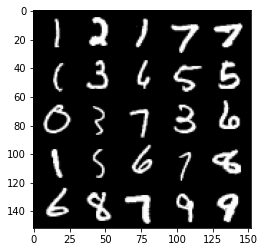

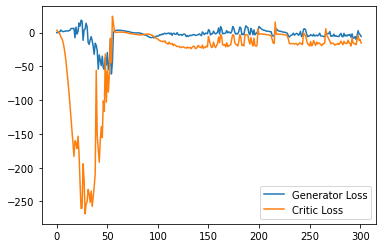

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6100: Generator loss: -6.596136152297259, critic loss: -14.199873786926267


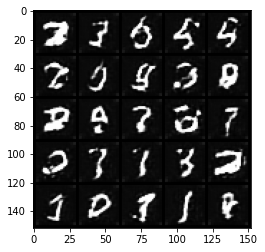

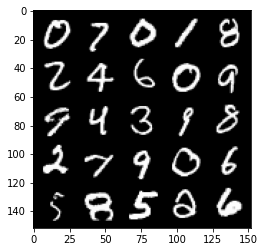

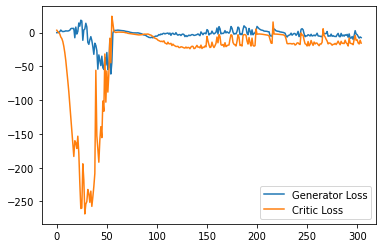

Step 6150: Generator loss: -8.445986499786377, critic loss: -16.614643428325657


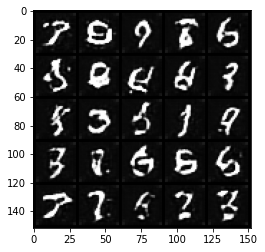

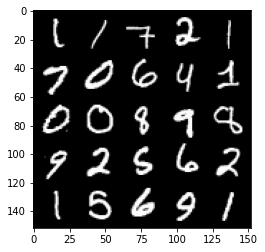

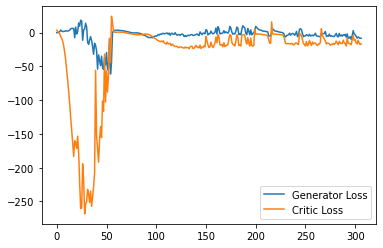

Step 6200: Generator loss: -5.086966739296913, critic loss: -13.737447655200958


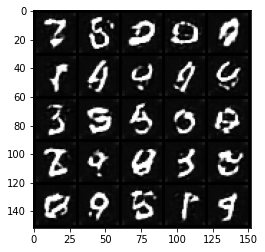

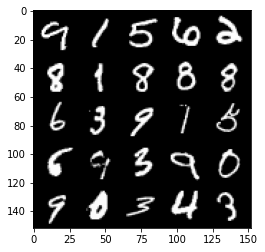

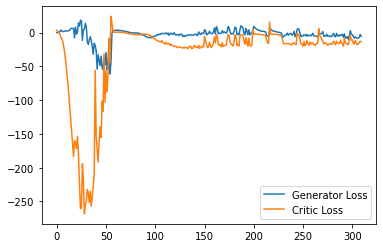

Step 6250: Generator loss: -10.164768335819245, critic loss: -13.908296717643735


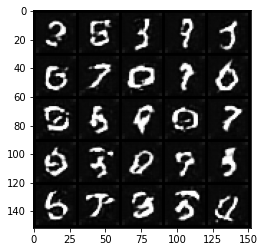

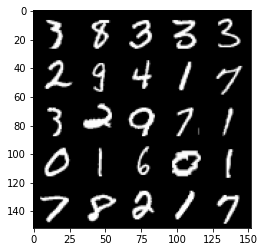

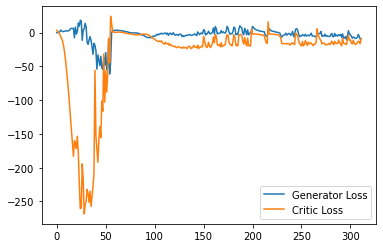

Step 6300: Generator loss: -11.822066804170609, critic loss: -17.245709584236145


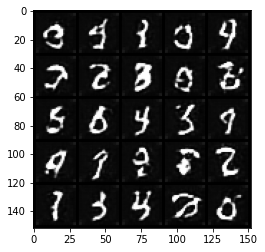

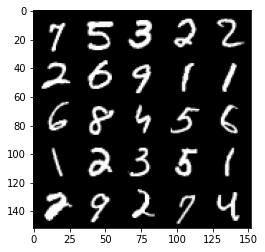

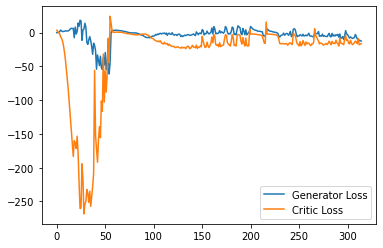

Step 6350: Generator loss: -11.208433157801629, critic loss: -13.971512477874757


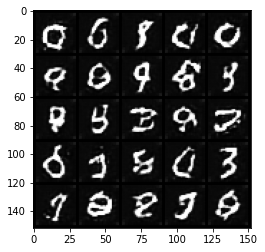

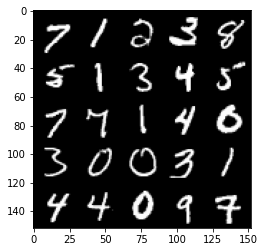

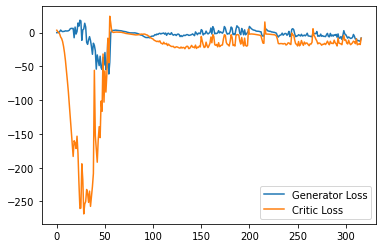

Step 6400: Generator loss: -9.616372470259666, critic loss: -15.64631492900849


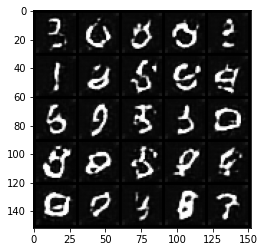

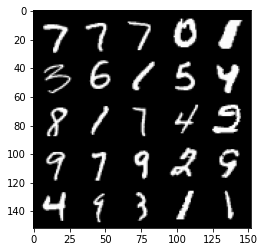

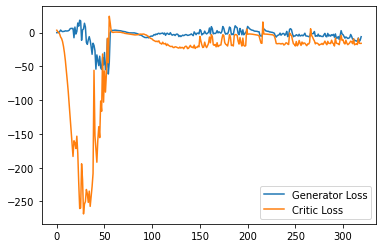

Step 6450: Generator loss: -12.518773252665996, critic loss: -15.640236298561097


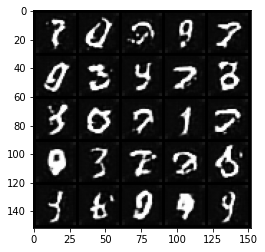

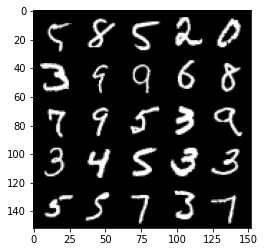

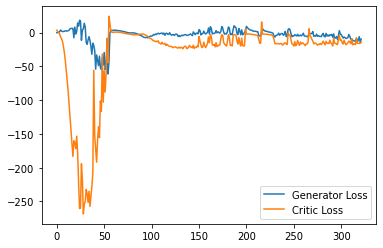

Step 6500: Generator loss: -13.04198271870613, critic loss: -17.31917887973785


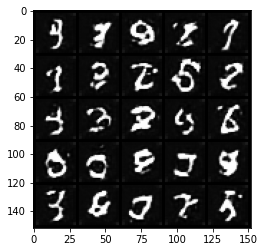

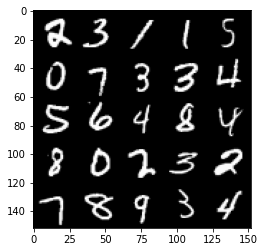

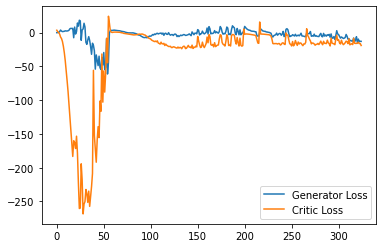

Step 6550: Generator loss: -12.877499977350235, critic loss: -17.959487117290493


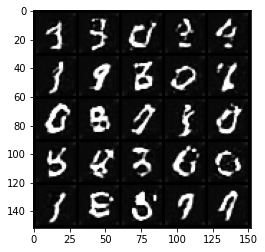

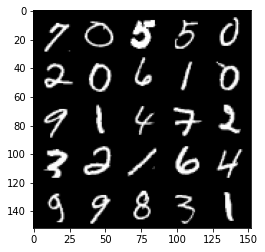

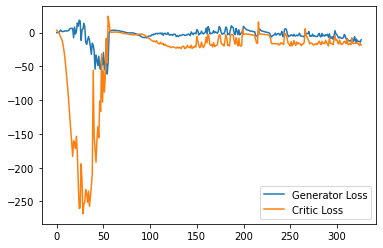

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6600: Generator loss: -13.027373416423798, critic loss: -16.330454877376557


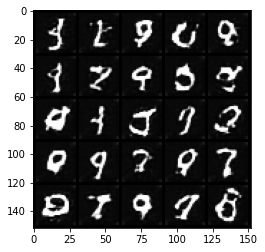

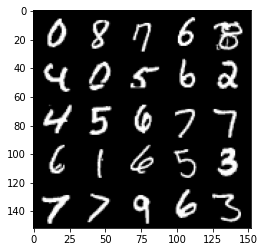

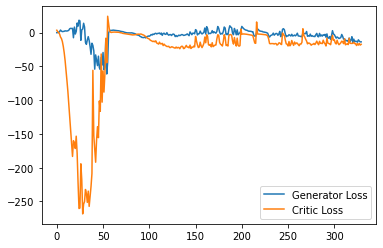

Step 6650: Generator loss: -13.701495966911317, critic loss: -15.28366541147232


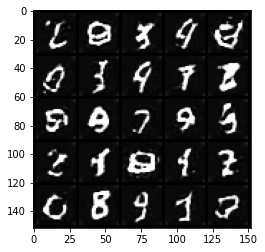

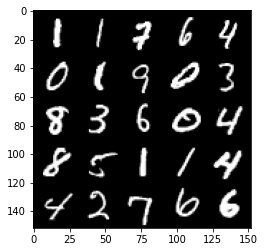

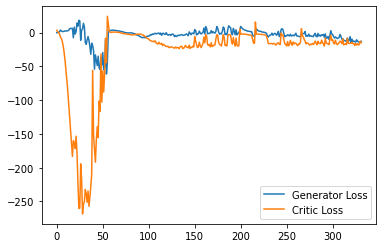

Step 6700: Generator loss: -15.75108962059021, critic loss: -17.496318424224857


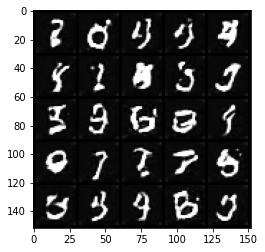

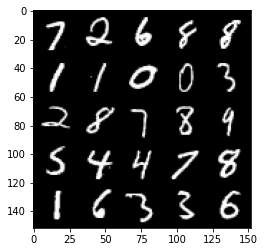

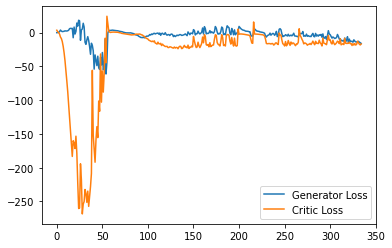

In [ ]:
import matplotlib.pyplot as plt

cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1


In [ ]:
!pip freeze